# Set Up
- Download the ECG dataset hosted on kaggle. **This step requires a Kaggle API token.**
- Clone the project repository to access the experiment models

In [ ]:
!pip install -q kaggle
!pip install lime
!pip install torchviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=bcf2ab00f0cca528c23895c534b67950c2465bd4148732dec474d00ebc306182
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4131 sha256=19d40ad0e474a9d2907b3457504f62b5bf4b31bb8ab52e3c7f010ac4b194dddf
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torchviz


In [ ]:
from google.colab import files

uploaded = files.upload()

# make sure there is a kaggle.json file
!ls -lha kaggle.json

# install the Kaggle API token
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
-rw-r--r-- 1 root root 67 Dec  2 21:18 kaggle.json


In [ ]:
# download and unzip the ECG dataset hosted on kaggle
!kaggle datasets download -d shayanfazeli/heartbeat
!unzip -q heartbeat.zip

# clone the project github repository
!git clone https://github.com/distributedgarden/tsc_attention.git

100% 98.8M/98.8M [00:03<00:00, 43.2MB/s]
100% 98.8M/98.8M [00:03<00:00, 33.7MB/s]
Cloning into 'tsc_attention'...
remote: Enumerating objects: 283, done.
remote: Counting objects: 100% (80/80), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 283 (delta 42), reused 52 (delta 16), pack-reused 203
Receiving objects: 100% (283/283), 4.40 MiB | 5.82 MiB/s, done.
Resolving deltas: 100% (153/153), done.


# OSCNN Experiment
### Description:
Use the ECG dataset to train the basic OSCNN model and evaluate its performance.


### Steps:
1. split the ECG data into train and test subsets
1. preprocess the subsets (standard scaling)
1. convert to pytorch tensors
1. set up the OSCNN model
1. train the OSCNN model
1. evaluate performance with accuracy, F1 score, precision, recall

In [ ]:
import logging
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc
from torch.autograd import Variable
from torch.utils.data import DataLoader, TensorDataset
from torchviz import make_dot
from IPython.core.display import HTML
from itertools import cycle
from functools import partial


%cd tsc_attention
from src.models.os_cnn import OSCNN
from src.models.attention_os_cnn import AttentionOSCNN
from src.utils import (
    evaluate,
    plot_metrics,
    plot_incorrect_predictions,
    visualize_model_graph,
    sample,
    batch_predict,
    explain_instance,
    roc_plot,
    generate_saliency_map,
    saliency_maps,
    overlay_saliency_maps,
)
%cd ..


/content/tsc_attention
/content


In [ ]:
logging.root.handlers = []

logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s - %(name)s - %(levelname)s - %(message)s"
)

logging.info("Test")

2023-12-02 21:18:19,517 - root - INFO - Test


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# load data
train_df = pd.read_csv("mitbih_train.csv", header=None)
test_df = pd.read_csv("mitbih_test.csv", header=None)

#train_df = train_df.sample(frac=0.01)

# last column is the label
X_train = train_df.iloc[:, :-1].values
y_train = train_df.iloc[:, -1].values
X_test = test_df.iloc[:, :-1].values
y_test = test_df.iloc[:, -1].values

print(len(train_df))
print(len(test_df))
print(len(X_train[1]))
print(X_train[1])

87554
21892
187
[0.96011394 0.86324787 0.46153846 0.1965812  0.0940171  0.12535612
 0.0997151  0.08831909 0.07407407 0.08262108 0.07407407 0.06267806
 0.06552707 0.06552707 0.06267806 0.07692308 0.07122507 0.08262108
 0.09116809 0.09686609 0.08262108 0.08262108 0.09116809 0.10541311
 0.12250713 0.14814815 0.18233618 0.19373219 0.21367522 0.20797721
 0.22222222 0.25356126 0.27065527 0.28774929 0.28490028 0.29344729
 0.25641027 0.24786325 0.18803419 0.14529915 0.10826211 0.08262108
 0.07977208 0.07407407 0.01424501 0.01139601 0.06267806 0.05128205
 0.05698006 0.04843305 0.02849003 0.03133903 0.07692308 0.02564103
 0.02849003 0.03703704 0.0940171  0.08547009 0.03988604 0.05982906
 0.07407407 0.07977208 0.09116809 0.0997151  0.10826211 0.08831909
 0.09116809 0.06552707 0.08547009 0.08831909 0.07692308 0.08262108
 0.09686609 0.0997151  0.13390313 0.1025641  0.03988604 0.06552707
 0.07407407 0.08262108 0.08547009 0.05698006 0.04558405 0.1025641
 0.03988604 0.01139601 0.01709402 0.03133903 0.

In [ ]:
# normalize the ECG signals
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# convert to tensors
X_train_tensor = torch.tensor(X_train).float().unsqueeze(2)  # Adding channel dimension
y_train_tensor = torch.tensor(y_train).long()
X_test_tensor = torch.tensor(X_test).float().unsqueeze(2)  # Adding channel dimension
y_test_tensor = torch.tensor(y_test).long()

# Dataset objects
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

# DataLoaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


In [ ]:
for batch in train_loader:
    print(batch[0].shape)
    break

torch.Size([32, 187, 1])


In [ ]:
# set parameters
# ECG data is univariate, so the input dimension is 1
#input_dim = 1
#hidden_dim = 128
#num_layers = 2
num_classes = 5

model = OSCNN(num_classes)
model.to(device)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

print(model)

OSCNN(
  (conv1): Conv1d(1, 128, kernel_size=(8,), stride=(1,), padding=same)
  (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv1d(128, 256, kernel_size=(5,), stride=(1,), padding=same)
  (bn2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv1d(256, 128, kernel_size=(3,), stride=(1,), padding=same)
  (bn3): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=128, out_features=5, bias=True)
)


In [ ]:
# store metrics for display
accuracies = []
precisions = []
recalls = []
f1_scores = []
losses = []
incorrect_indexes = []

# train
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    for i, (inputs, labels) in enumerate(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        if (i+1) % 100 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], Loss: {loss.item():.4f}")

    # average loss for this epoch
    epoch_loss = total_loss / len(train_loader)
    losses.append(epoch_loss)

    # store metrics
    accuracy, precision, recall, f1, epoch_incorrect_indexes, _ = evaluate(model, test_loader)
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    incorrect_indexes.append(epoch_incorrect_indexes)


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:306: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at ../aten/src/ATen/native/Convolution.cpp:1008.)
  return F.conv1d(input, weight, bias, self.stride,


Epoch [1/10], Step [100/2737], Loss: 0.4949
Epoch [1/10], Step [200/2737], Loss: 0.5998
Epoch [1/10], Step [300/2737], Loss: 0.2797
Epoch [1/10], Step [400/2737], Loss: 0.3361
Epoch [1/10], Step [500/2737], Loss: 0.3571
Epoch [1/10], Step [600/2737], Loss: 0.5837
Epoch [1/10], Step [700/2737], Loss: 0.4024
Epoch [1/10], Step [800/2737], Loss: 0.2056
Epoch [1/10], Step [900/2737], Loss: 0.1239
Epoch [1/10], Step [1000/2737], Loss: 0.0604
Epoch [1/10], Step [1100/2737], Loss: 0.0600
Epoch [1/10], Step [1200/2737], Loss: 0.1765
Epoch [1/10], Step [1300/2737], Loss: 0.1148
Epoch [1/10], Step [1400/2737], Loss: 0.0897
Epoch [1/10], Step [1500/2737], Loss: 0.1295
Epoch [1/10], Step [1600/2737], Loss: 0.3225
Epoch [1/10], Step [1700/2737], Loss: 0.2335
Epoch [1/10], Step [1800/2737], Loss: 0.0856
Epoch [1/10], Step [1900/2737], Loss: 0.0964
Epoch [1/10], Step [2000/2737], Loss: 0.3248
Epoch [1/10], Step [2100/2737], Loss: 0.3270
Epoch [1/10], Step [2200/2737], Loss: 0.1014
Epoch [1/10], Step 

2023-12-02 21:18:49,747 - root - INFO - Accuracy: 94.26%
2023-12-02 21:18:49,748 - root - INFO - Precision: 0.9345
2023-12-02 21:18:49,749 - root - INFO - Recall: 0.9426
2023-12-02 21:18:49,750 - root - INFO - F1 Score: 0.9298


Epoch [2/10], Step [100/2737], Loss: 0.0600
Epoch [2/10], Step [200/2737], Loss: 0.1820
Epoch [2/10], Step [300/2737], Loss: 0.0935
Epoch [2/10], Step [400/2737], Loss: 0.2033
Epoch [2/10], Step [500/2737], Loss: 0.0781
Epoch [2/10], Step [600/2737], Loss: 0.2487
Epoch [2/10], Step [700/2737], Loss: 0.2322
Epoch [2/10], Step [800/2737], Loss: 0.1305
Epoch [2/10], Step [900/2737], Loss: 0.0920
Epoch [2/10], Step [1000/2737], Loss: 0.0632
Epoch [2/10], Step [1100/2737], Loss: 0.1465
Epoch [2/10], Step [1200/2737], Loss: 0.2338
Epoch [2/10], Step [1300/2737], Loss: 0.1126
Epoch [2/10], Step [1400/2737], Loss: 0.0396
Epoch [2/10], Step [1500/2737], Loss: 0.0704
Epoch [2/10], Step [1600/2737], Loss: 0.2768
Epoch [2/10], Step [1700/2737], Loss: 0.0882
Epoch [2/10], Step [1800/2737], Loss: 0.1841
Epoch [2/10], Step [1900/2737], Loss: 0.1498
Epoch [2/10], Step [2000/2737], Loss: 0.1078
Epoch [2/10], Step [2100/2737], Loss: 0.0174
Epoch [2/10], Step [2200/2737], Loss: 0.1358
Epoch [2/10], Step 

2023-12-02 21:19:00,020 - root - INFO - Accuracy: 93.66%
2023-12-02 21:19:00,021 - root - INFO - Precision: 0.9522
2023-12-02 21:19:00,022 - root - INFO - Recall: 0.9366
2023-12-02 21:19:00,023 - root - INFO - F1 Score: 0.9411


Epoch [3/10], Step [100/2737], Loss: 0.1461
Epoch [3/10], Step [200/2737], Loss: 0.0669
Epoch [3/10], Step [300/2737], Loss: 0.1799
Epoch [3/10], Step [400/2737], Loss: 0.2071
Epoch [3/10], Step [500/2737], Loss: 0.2467
Epoch [3/10], Step [600/2737], Loss: 0.2131
Epoch [3/10], Step [700/2737], Loss: 0.1434
Epoch [3/10], Step [800/2737], Loss: 0.1262
Epoch [3/10], Step [900/2737], Loss: 0.2090
Epoch [3/10], Step [1000/2737], Loss: 0.0548
Epoch [3/10], Step [1100/2737], Loss: 0.0605
Epoch [3/10], Step [1200/2737], Loss: 0.1478
Epoch [3/10], Step [1300/2737], Loss: 0.2153
Epoch [3/10], Step [1400/2737], Loss: 0.1330
Epoch [3/10], Step [1500/2737], Loss: 0.0772
Epoch [3/10], Step [1600/2737], Loss: 0.1580
Epoch [3/10], Step [1700/2737], Loss: 0.0702
Epoch [3/10], Step [1800/2737], Loss: 0.0290
Epoch [3/10], Step [1900/2737], Loss: 0.0192
Epoch [3/10], Step [2000/2737], Loss: 0.0764
Epoch [3/10], Step [2100/2737], Loss: 0.0510
Epoch [3/10], Step [2200/2737], Loss: 0.1943
Epoch [3/10], Step 

2023-12-02 21:19:10,402 - root - INFO - Accuracy: 96.91%
2023-12-02 21:19:10,404 - root - INFO - Precision: 0.9674
2023-12-02 21:19:10,404 - root - INFO - Recall: 0.9691
2023-12-02 21:19:10,405 - root - INFO - F1 Score: 0.9673


Epoch [4/10], Step [100/2737], Loss: 0.0263
Epoch [4/10], Step [200/2737], Loss: 0.0652
Epoch [4/10], Step [300/2737], Loss: 0.0418
Epoch [4/10], Step [400/2737], Loss: 0.2241
Epoch [4/10], Step [500/2737], Loss: 0.0391
Epoch [4/10], Step [600/2737], Loss: 0.0377
Epoch [4/10], Step [700/2737], Loss: 0.1582
Epoch [4/10], Step [800/2737], Loss: 0.0383
Epoch [4/10], Step [900/2737], Loss: 0.0424
Epoch [4/10], Step [1000/2737], Loss: 0.0844
Epoch [4/10], Step [1100/2737], Loss: 0.0290
Epoch [4/10], Step [1200/2737], Loss: 0.0466
Epoch [4/10], Step [1300/2737], Loss: 0.0329
Epoch [4/10], Step [1400/2737], Loss: 0.0764
Epoch [4/10], Step [1500/2737], Loss: 0.1703
Epoch [4/10], Step [1600/2737], Loss: 0.2128
Epoch [4/10], Step [1700/2737], Loss: 0.0158
Epoch [4/10], Step [1800/2737], Loss: 0.0944
Epoch [4/10], Step [1900/2737], Loss: 0.0392
Epoch [4/10], Step [2000/2737], Loss: 0.0918
Epoch [4/10], Step [2100/2737], Loss: 0.0637
Epoch [4/10], Step [2200/2737], Loss: 0.1563
Epoch [4/10], Step 

2023-12-02 21:19:20,659 - root - INFO - Accuracy: 96.91%
2023-12-02 21:19:20,661 - root - INFO - Precision: 0.9681
2023-12-02 21:19:20,662 - root - INFO - Recall: 0.9691
2023-12-02 21:19:20,663 - root - INFO - F1 Score: 0.9672


Epoch [5/10], Step [100/2737], Loss: 0.0244
Epoch [5/10], Step [200/2737], Loss: 0.0990
Epoch [5/10], Step [300/2737], Loss: 0.2393
Epoch [5/10], Step [400/2737], Loss: 0.1999
Epoch [5/10], Step [500/2737], Loss: 0.1051
Epoch [5/10], Step [600/2737], Loss: 0.3721
Epoch [5/10], Step [700/2737], Loss: 0.0764
Epoch [5/10], Step [800/2737], Loss: 0.0439
Epoch [5/10], Step [900/2737], Loss: 0.0296
Epoch [5/10], Step [1000/2737], Loss: 0.0395
Epoch [5/10], Step [1100/2737], Loss: 0.0404
Epoch [5/10], Step [1200/2737], Loss: 0.3368
Epoch [5/10], Step [1300/2737], Loss: 0.1168
Epoch [5/10], Step [1400/2737], Loss: 0.3896
Epoch [5/10], Step [1500/2737], Loss: 0.0617
Epoch [5/10], Step [1600/2737], Loss: 0.1518
Epoch [5/10], Step [1700/2737], Loss: 0.1493
Epoch [5/10], Step [1800/2737], Loss: 0.1883
Epoch [5/10], Step [1900/2737], Loss: 0.0282
Epoch [5/10], Step [2000/2737], Loss: 0.0752
Epoch [5/10], Step [2100/2737], Loss: 0.0512
Epoch [5/10], Step [2200/2737], Loss: 0.1314
Epoch [5/10], Step 

2023-12-02 21:19:31,031 - root - INFO - Accuracy: 97.21%
2023-12-02 21:19:31,032 - root - INFO - Precision: 0.9719
2023-12-02 21:19:31,034 - root - INFO - Recall: 0.9721
2023-12-02 21:19:31,035 - root - INFO - F1 Score: 0.9694


Epoch [6/10], Step [100/2737], Loss: 0.1205
Epoch [6/10], Step [200/2737], Loss: 0.1470
Epoch [6/10], Step [300/2737], Loss: 0.0197
Epoch [6/10], Step [400/2737], Loss: 0.0740
Epoch [6/10], Step [500/2737], Loss: 0.0597
Epoch [6/10], Step [600/2737], Loss: 0.2111
Epoch [6/10], Step [700/2737], Loss: 0.1598
Epoch [6/10], Step [800/2737], Loss: 0.0458
Epoch [6/10], Step [900/2737], Loss: 0.0236
Epoch [6/10], Step [1000/2737], Loss: 0.0129
Epoch [6/10], Step [1100/2737], Loss: 0.0642
Epoch [6/10], Step [1200/2737], Loss: 0.1036
Epoch [6/10], Step [1300/2737], Loss: 0.0715
Epoch [6/10], Step [1400/2737], Loss: 0.1962
Epoch [6/10], Step [1500/2737], Loss: 0.0427
Epoch [6/10], Step [1600/2737], Loss: 0.3482
Epoch [6/10], Step [1700/2737], Loss: 0.0103
Epoch [6/10], Step [1800/2737], Loss: 0.0600
Epoch [6/10], Step [1900/2737], Loss: 0.0418
Epoch [6/10], Step [2000/2737], Loss: 0.0914
Epoch [6/10], Step [2100/2737], Loss: 0.0302
Epoch [6/10], Step [2200/2737], Loss: 0.0920
Epoch [6/10], Step 

2023-12-02 21:19:41,373 - root - INFO - Accuracy: 95.51%
2023-12-02 21:19:41,374 - root - INFO - Precision: 0.9618
2023-12-02 21:19:41,375 - root - INFO - Recall: 0.9551
2023-12-02 21:19:41,377 - root - INFO - F1 Score: 0.9572


Epoch [7/10], Step [100/2737], Loss: 0.1427
Epoch [7/10], Step [200/2737], Loss: 0.2779
Epoch [7/10], Step [300/2737], Loss: 0.0877
Epoch [7/10], Step [400/2737], Loss: 0.0907
Epoch [7/10], Step [500/2737], Loss: 0.0220
Epoch [7/10], Step [600/2737], Loss: 0.1717
Epoch [7/10], Step [700/2737], Loss: 0.0270
Epoch [7/10], Step [800/2737], Loss: 0.1412
Epoch [7/10], Step [900/2737], Loss: 0.1204
Epoch [7/10], Step [1000/2737], Loss: 0.1644
Epoch [7/10], Step [1100/2737], Loss: 0.0544
Epoch [7/10], Step [1200/2737], Loss: 0.0212
Epoch [7/10], Step [1300/2737], Loss: 0.1604
Epoch [7/10], Step [1400/2737], Loss: 0.2047
Epoch [7/10], Step [1500/2737], Loss: 0.0596
Epoch [7/10], Step [1600/2737], Loss: 0.1907
Epoch [7/10], Step [1700/2737], Loss: 0.2104
Epoch [7/10], Step [1800/2737], Loss: 0.0889
Epoch [7/10], Step [1900/2737], Loss: 0.1712
Epoch [7/10], Step [2000/2737], Loss: 0.0233
Epoch [7/10], Step [2100/2737], Loss: 0.1454
Epoch [7/10], Step [2200/2737], Loss: 0.0512
Epoch [7/10], Step 

2023-12-02 21:19:51,662 - root - INFO - Accuracy: 97.42%
2023-12-02 21:19:51,663 - root - INFO - Precision: 0.9736
2023-12-02 21:19:51,664 - root - INFO - Recall: 0.9742
2023-12-02 21:19:51,665 - root - INFO - F1 Score: 0.9735


Epoch [8/10], Step [100/2737], Loss: 0.0123
Epoch [8/10], Step [200/2737], Loss: 0.0993
Epoch [8/10], Step [300/2737], Loss: 0.1866
Epoch [8/10], Step [400/2737], Loss: 0.0076
Epoch [8/10], Step [500/2737], Loss: 0.0088
Epoch [8/10], Step [600/2737], Loss: 0.0999
Epoch [8/10], Step [700/2737], Loss: 0.0182
Epoch [8/10], Step [800/2737], Loss: 0.1443
Epoch [8/10], Step [900/2737], Loss: 0.0111
Epoch [8/10], Step [1000/2737], Loss: 0.0102
Epoch [8/10], Step [1100/2737], Loss: 0.0475
Epoch [8/10], Step [1200/2737], Loss: 0.0316
Epoch [8/10], Step [1300/2737], Loss: 0.0278
Epoch [8/10], Step [1400/2737], Loss: 0.0152
Epoch [8/10], Step [1500/2737], Loss: 0.0310
Epoch [8/10], Step [1600/2737], Loss: 0.0476
Epoch [8/10], Step [1700/2737], Loss: 0.0217
Epoch [8/10], Step [1800/2737], Loss: 0.0282
Epoch [8/10], Step [1900/2737], Loss: 0.0158
Epoch [8/10], Step [2000/2737], Loss: 0.0120
Epoch [8/10], Step [2100/2737], Loss: 0.0122
Epoch [8/10], Step [2200/2737], Loss: 0.0719
Epoch [8/10], Step 

2023-12-02 21:20:01,955 - root - INFO - Accuracy: 97.62%
2023-12-02 21:20:01,957 - root - INFO - Precision: 0.9754
2023-12-02 21:20:01,959 - root - INFO - Recall: 0.9762
2023-12-02 21:20:01,960 - root - INFO - F1 Score: 0.9749


Epoch [9/10], Step [100/2737], Loss: 0.2356
Epoch [9/10], Step [200/2737], Loss: 0.0332
Epoch [9/10], Step [300/2737], Loss: 0.0253
Epoch [9/10], Step [400/2737], Loss: 0.1292
Epoch [9/10], Step [500/2737], Loss: 0.2006
Epoch [9/10], Step [600/2737], Loss: 0.0491
Epoch [9/10], Step [700/2737], Loss: 0.0317
Epoch [9/10], Step [800/2737], Loss: 0.0745
Epoch [9/10], Step [900/2737], Loss: 0.0116
Epoch [9/10], Step [1000/2737], Loss: 0.2644
Epoch [9/10], Step [1100/2737], Loss: 0.2971
Epoch [9/10], Step [1200/2737], Loss: 0.2064
Epoch [9/10], Step [1300/2737], Loss: 0.2090
Epoch [9/10], Step [1400/2737], Loss: 0.0955
Epoch [9/10], Step [1500/2737], Loss: 0.0576
Epoch [9/10], Step [1600/2737], Loss: 0.1089
Epoch [9/10], Step [1700/2737], Loss: 0.0276
Epoch [9/10], Step [1800/2737], Loss: 0.0929
Epoch [9/10], Step [1900/2737], Loss: 0.1224
Epoch [9/10], Step [2000/2737], Loss: 0.0135
Epoch [9/10], Step [2100/2737], Loss: 0.0237
Epoch [9/10], Step [2200/2737], Loss: 0.2828
Epoch [9/10], Step 

2023-12-02 21:20:12,216 - root - INFO - Accuracy: 97.71%
2023-12-02 21:20:12,218 - root - INFO - Precision: 0.9764
2023-12-02 21:20:12,218 - root - INFO - Recall: 0.9771
2023-12-02 21:20:12,219 - root - INFO - F1 Score: 0.9758


Epoch [10/10], Step [100/2737], Loss: 0.1445
Epoch [10/10], Step [200/2737], Loss: 0.0443
Epoch [10/10], Step [300/2737], Loss: 0.2426
Epoch [10/10], Step [400/2737], Loss: 0.0144
Epoch [10/10], Step [500/2737], Loss: 0.0132
Epoch [10/10], Step [600/2737], Loss: 0.0259
Epoch [10/10], Step [700/2737], Loss: 0.0322
Epoch [10/10], Step [800/2737], Loss: 0.2618
Epoch [10/10], Step [900/2737], Loss: 0.0230
Epoch [10/10], Step [1000/2737], Loss: 0.0102
Epoch [10/10], Step [1100/2737], Loss: 0.1343
Epoch [10/10], Step [1200/2737], Loss: 0.0864
Epoch [10/10], Step [1300/2737], Loss: 0.0154
Epoch [10/10], Step [1400/2737], Loss: 0.0149
Epoch [10/10], Step [1500/2737], Loss: 0.1563
Epoch [10/10], Step [1600/2737], Loss: 0.0647
Epoch [10/10], Step [1700/2737], Loss: 0.0263
Epoch [10/10], Step [1800/2737], Loss: 0.0587
Epoch [10/10], Step [1900/2737], Loss: 0.2134
Epoch [10/10], Step [2000/2737], Loss: 0.0226
Epoch [10/10], Step [2100/2737], Loss: 0.0125
Epoch [10/10], Step [2200/2737], Loss: 0.00

2023-12-02 21:20:22,395 - root - INFO - Accuracy: 97.73%
2023-12-02 21:20:22,397 - root - INFO - Precision: 0.9762
2023-12-02 21:20:22,397 - root - INFO - Recall: 0.9773
2023-12-02 21:20:22,398 - root - INFO - F1 Score: 0.9762


In [ ]:
torch.save(model, "tsc_oscnn.pth")

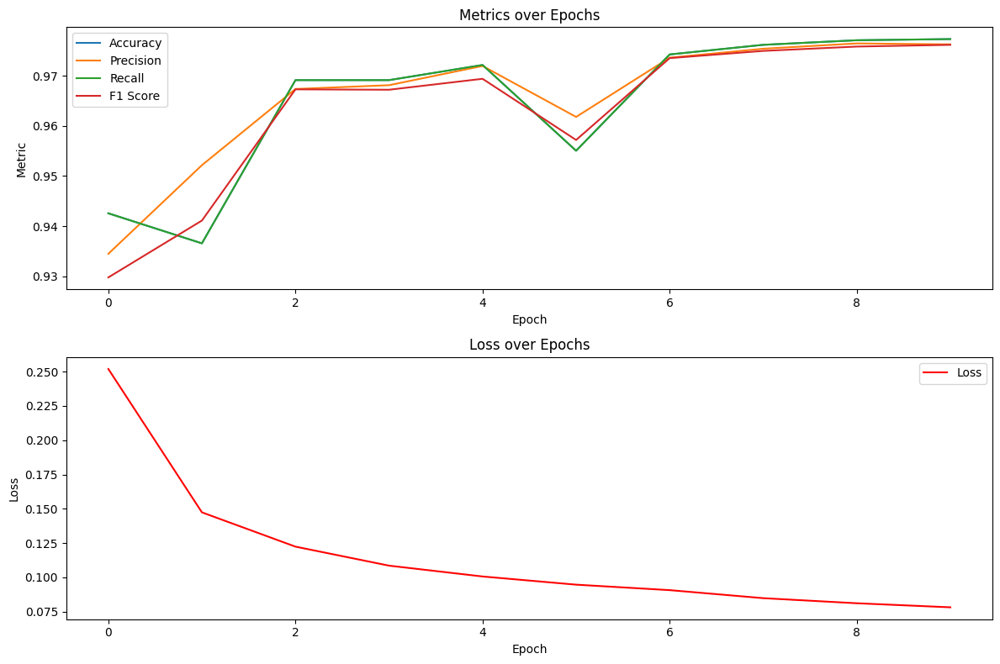

In [ ]:
plot_metrics(accuracies, precisions, recalls, f1_scores, losses, "oscnn_metrics")

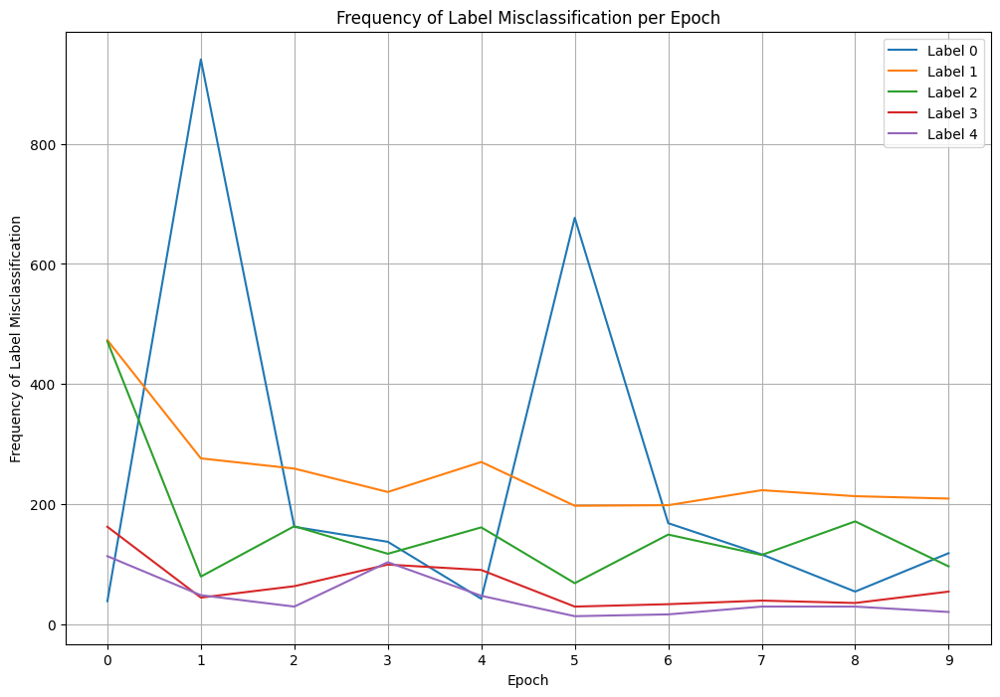

In [ ]:
plot_incorrect_predictions(incorrect_indexes, test_loader, "oscnn_misclassification")

# OSCNN LIME Analysis

In [ ]:
# instances to explain
correct_samples, incorrect_samples = sample(model, test_loader, num_samples=25)


In [ ]:
# LimeTabularExplainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,    # raw data; not tensored or scaled
    feature_names=[f"timepoint_{i}" for i in range(X_train.shape[1])],
    class_names=[str(i) for i in np.unique(y_train)],
    mode="classification"
)

In [ ]:
explanations_html = []
for test_idx in correct_samples:
    test_instance = X_test[test_idx]
    true_label = y_test[test_idx]
    explanation_html = explain_instance(
        model,
        explainer,
        test_instance,
        true_label,
        test_idx,
        y_train,
        num_features=200,
    )
    explanations_html.append(explanation_html)

with open("lime_oscnn_correct.html", "w") as file:
    for explanation_html in explanations_html:
        file.write(explanation_html + "<hr>")

2023-12-02 21:20:29,365 - root - INFO - Instance 10331: Predicted Label: 0, True Label: 0.0
2023-12-02 21:20:30,223 - root - INFO - Instance 9675: Predicted Label: 0, True Label: 0.0
2023-12-02 21:20:31,322 - root - INFO - Instance 1989: Predicted Label: 0, True Label: 0.0
2023-12-02 21:20:32,508 - root - INFO - Instance 6684: Predicted Label: 0, True Label: 0.0
2023-12-02 21:20:33,426 - root - INFO - Instance 15661: Predicted Label: 0, True Label: 0.0
2023-12-02 21:20:34,297 - root - INFO - Instance 9910: Predicted Label: 0, True Label: 0.0
2023-12-02 21:20:35,245 - root - INFO - Instance 2778: Predicted Label: 0, True Label: 0.0
2023-12-02 21:20:36,160 - root - INFO - Instance 7433: Predicted Label: 0, True Label: 0.0
2023-12-02 21:20:37,128 - root - INFO - Instance 4684: Predicted Label: 0, True Label: 0.0
2023-12-02 21:20:38,163 - root - INFO - Instance 4121: Predicted Label: 0, True Label: 0.0
2023-12-02 21:20:39,046 - root - INFO - Instance 11552: Predicted Label: 0, True Label: 

In [ ]:
explanations_html = []
for test_idx in incorrect_samples:
    test_instance = X_test[test_idx]
    true_label = y_test[test_idx]
    explanation_html = explain_instance(
        model,
        explainer,
        test_instance,
        true_label,
        test_idx,
        y_train,
        num_features=200,
    )
    explanations_html.append(explanation_html)

with open("lime_oscnn_incorrect.html", "w") as file:
    for explanation_html in explanations_html:
        file.write(explanation_html)
        file.write("<hr>")

2023-12-02 21:20:51,851 - root - INFO - Instance 18119: Predicted Label: 0, True Label: 1.0
2023-12-02 21:20:52,551 - root - INFO - Instance 20245: Predicted Label: 0, True Label: 3.0
2023-12-02 21:20:53,466 - root - INFO - Instance 18352: Predicted Label: 0, True Label: 1.0
2023-12-02 21:20:54,391 - root - INFO - Instance 4441: Predicted Label: 2, True Label: 0.0
2023-12-02 21:20:55,230 - root - INFO - Instance 13116: Predicted Label: 2, True Label: 0.0
2023-12-02 21:20:56,119 - root - INFO - Instance 18196: Predicted Label: 0, True Label: 1.0
2023-12-02 21:20:57,109 - root - INFO - Instance 20244: Predicted Label: 2, True Label: 3.0
2023-12-02 21:20:58,168 - root - INFO - Instance 18622: Predicted Label: 0, True Label: 1.0
2023-12-02 21:20:59,314 - root - INFO - Instance 20207: Predicted Label: 2, True Label: 3.0
2023-12-02 21:21:00,056 - root - INFO - Instance 2329: Predicted Label: 2, True Label: 0.0
2023-12-02 21:21:00,985 - root - INFO - Instance 20012: Predicted Label: 0, True L

In [ ]:
idx = correct_samples[0]
sample_input = X_test_tensor[idx:idx+1]
visualize_model_graph(model, sample_input, file_name=f"computation_graph_oscnn_{idx}")

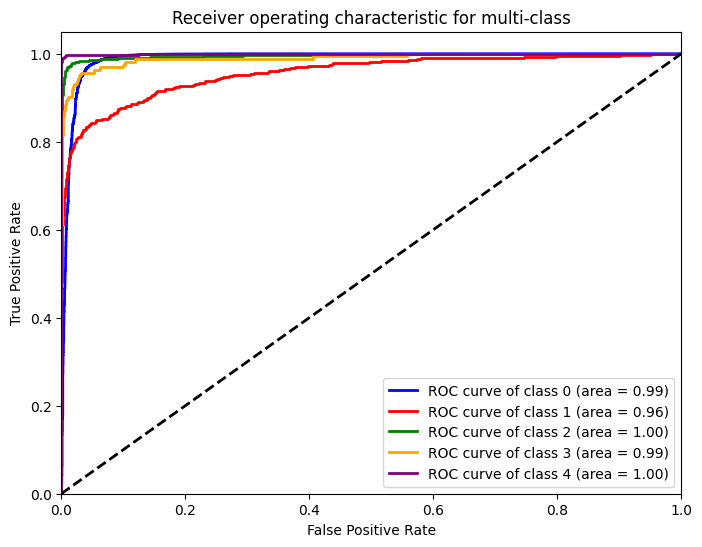

In [ ]:
roc_plot(model, X_test, y_test, num_classes, "roc_oscnn")

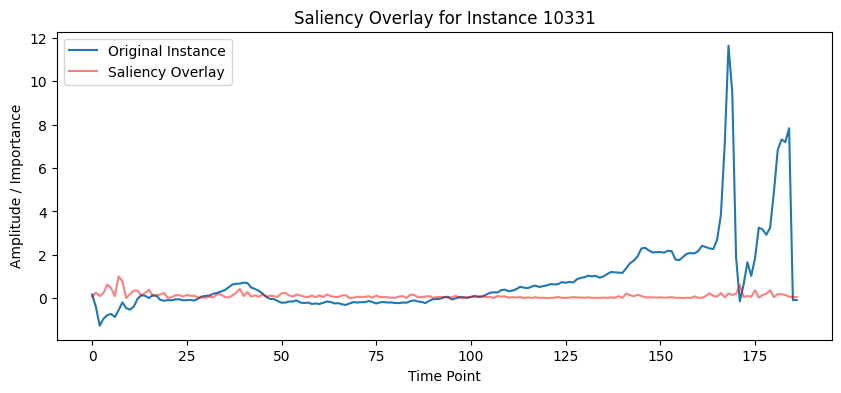

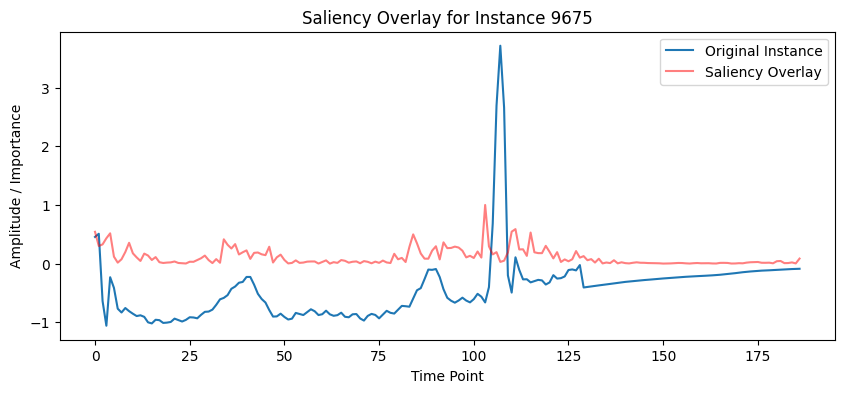

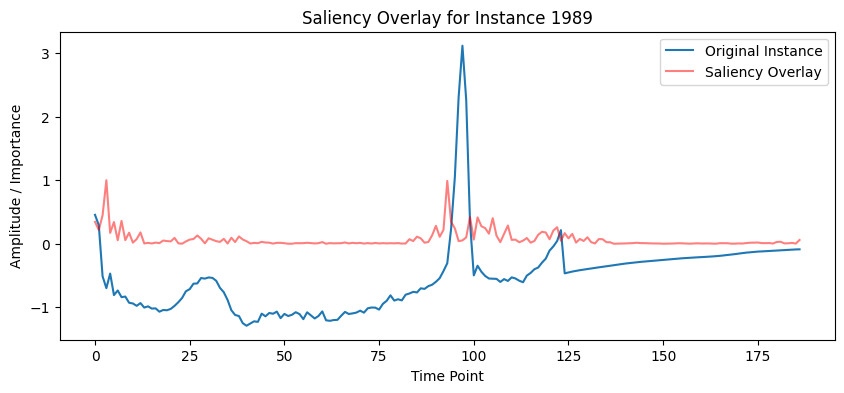

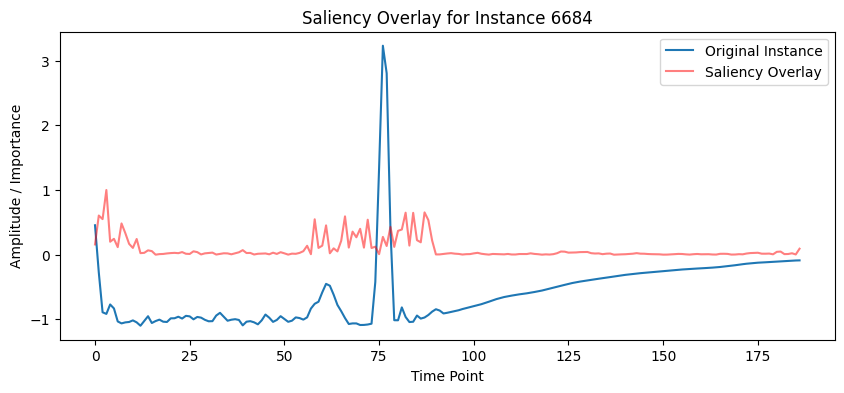

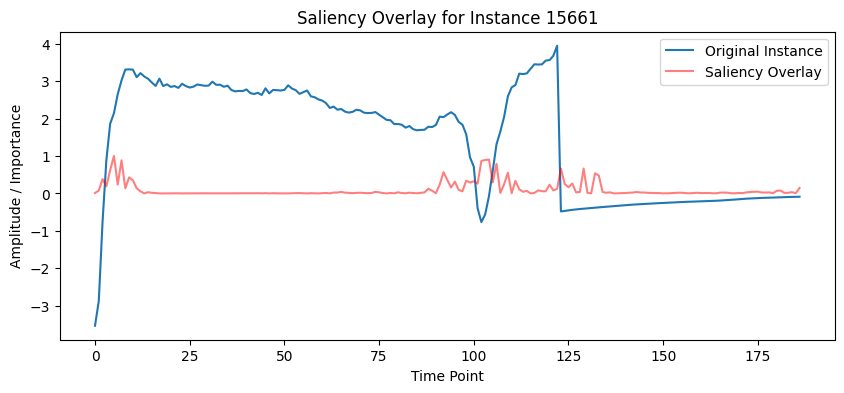

...

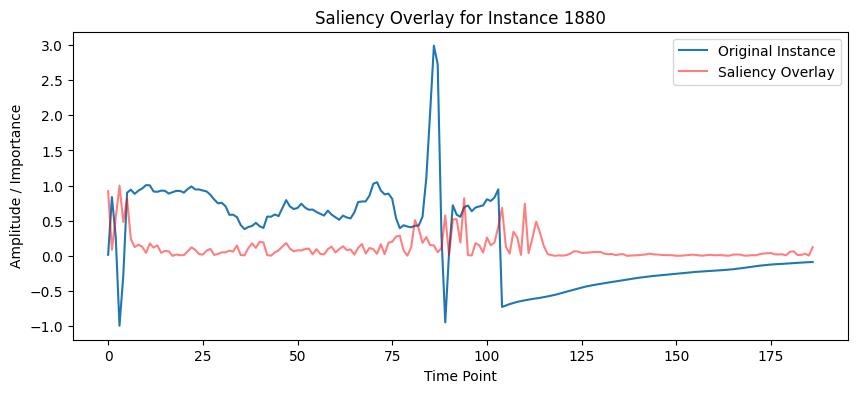

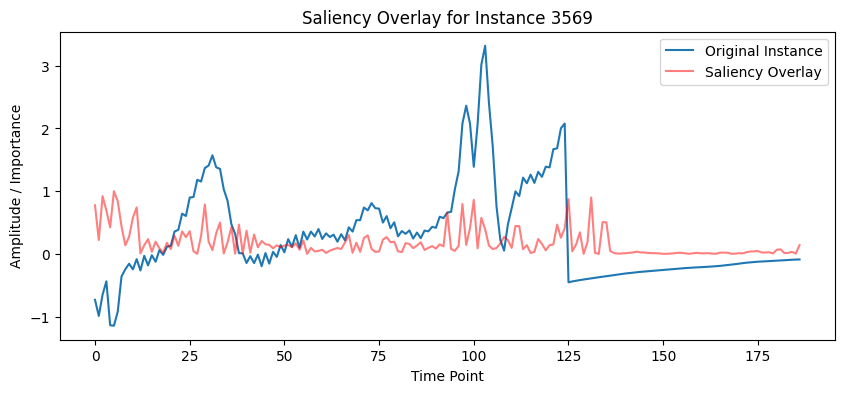

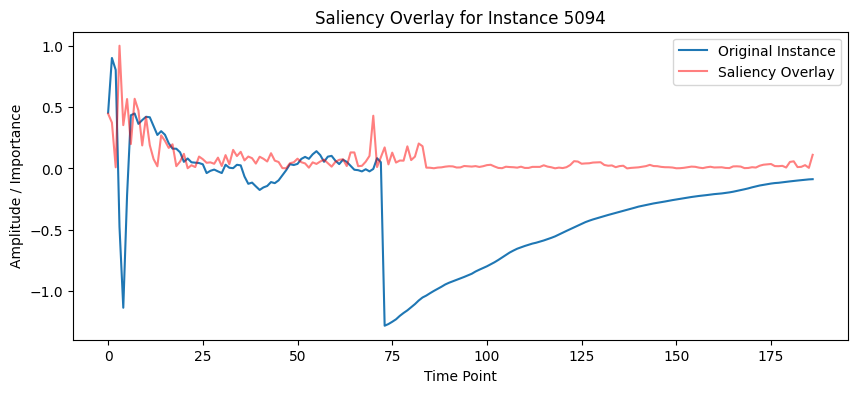

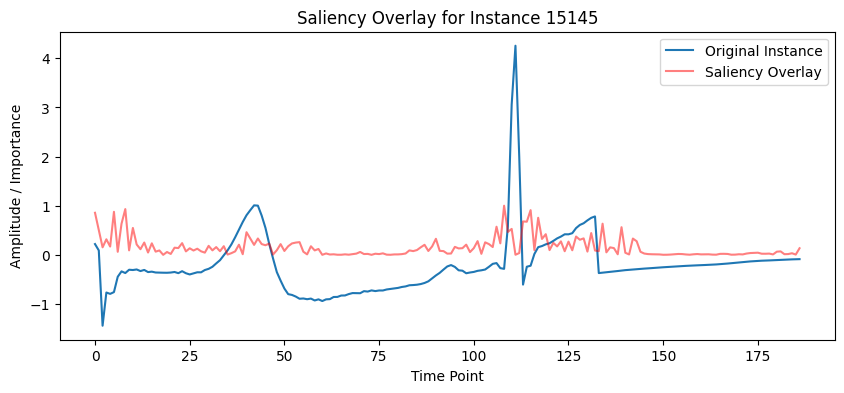

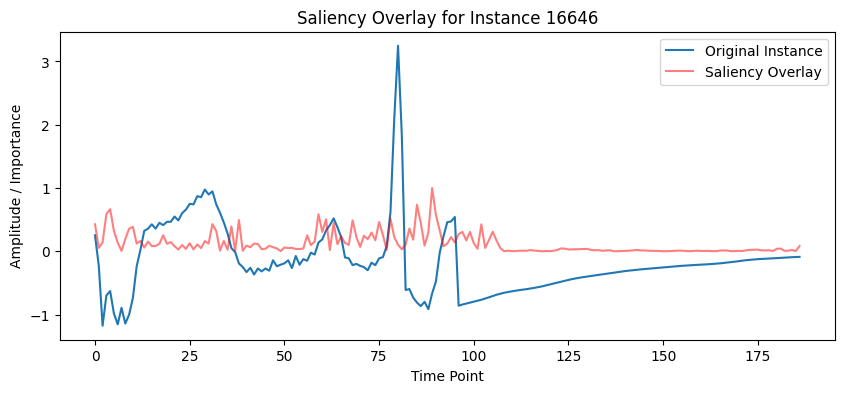

In [ ]:
overlay_saliency_maps(model, X_test_tensor, correct_samples, "oscnn_correct")

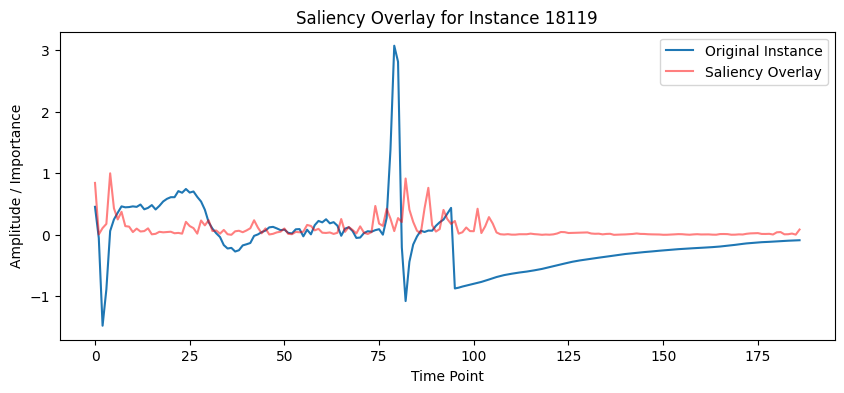

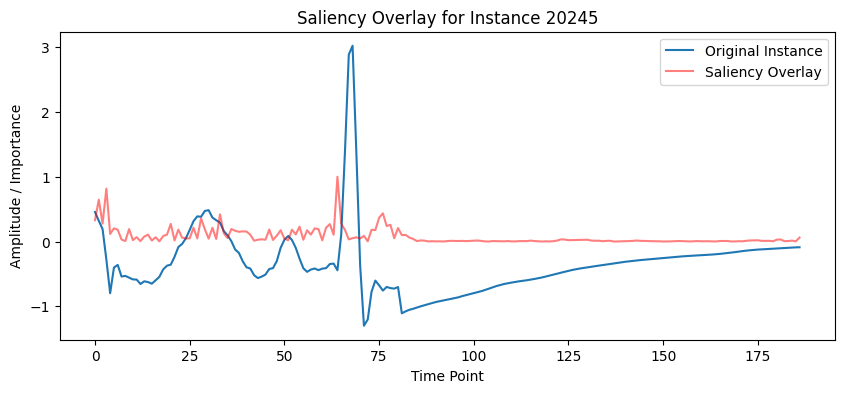

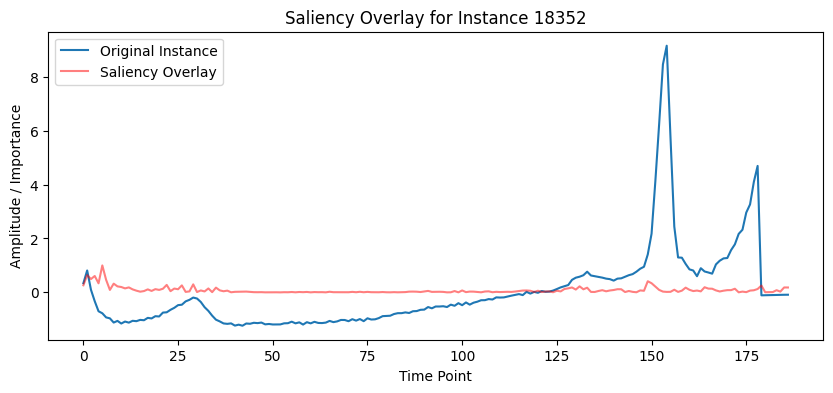

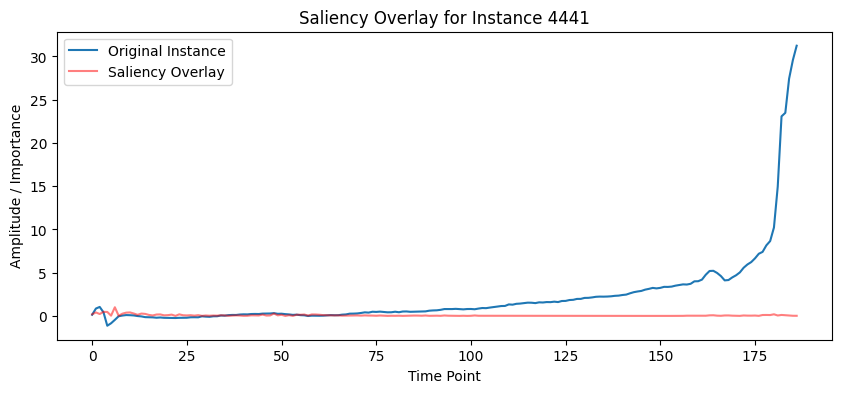

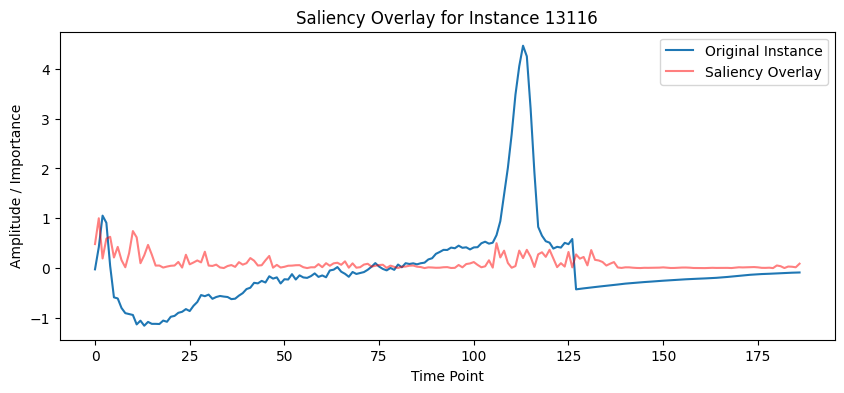

...

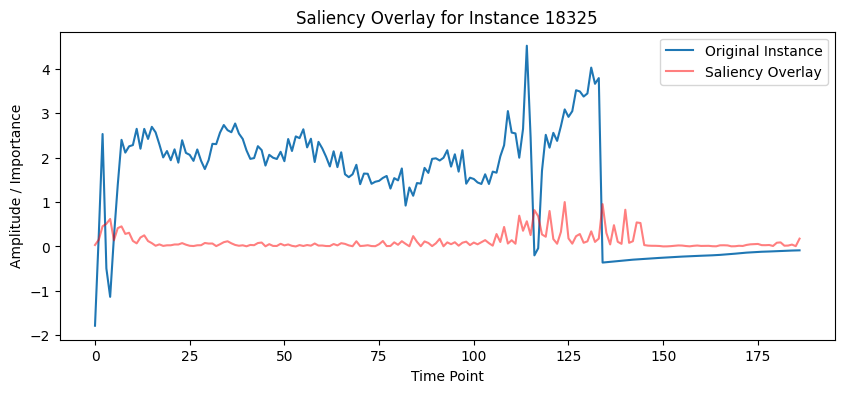

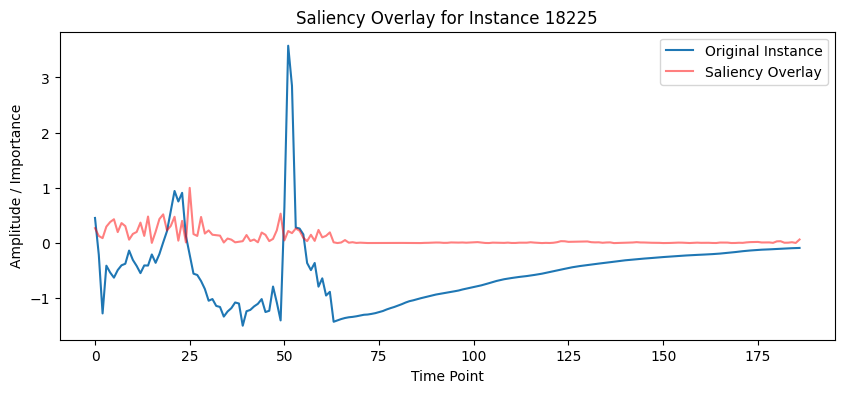

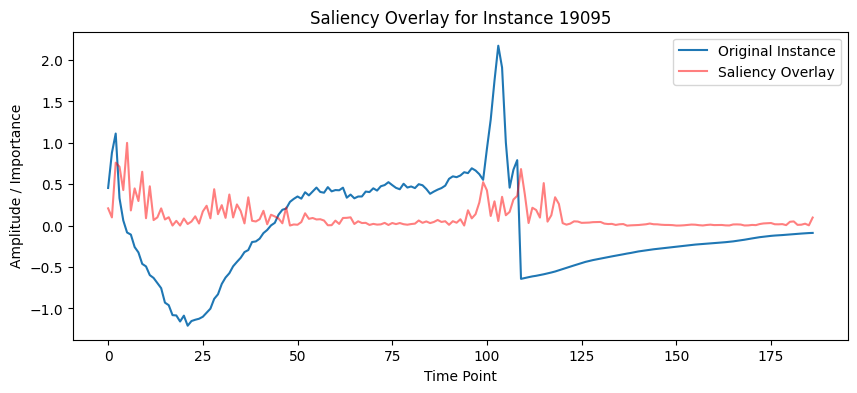

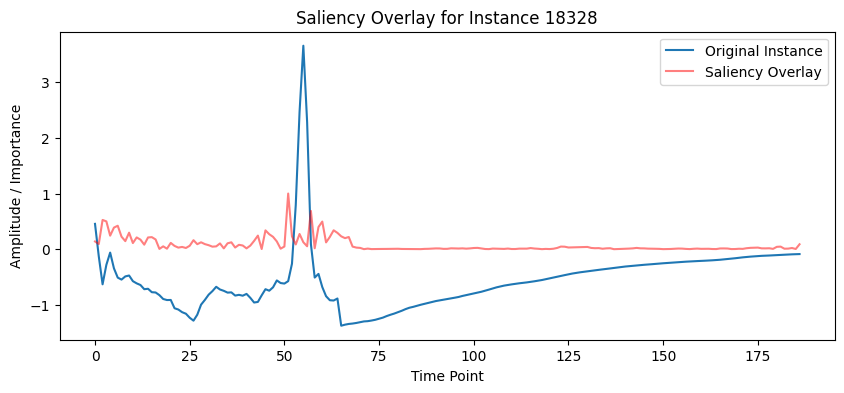

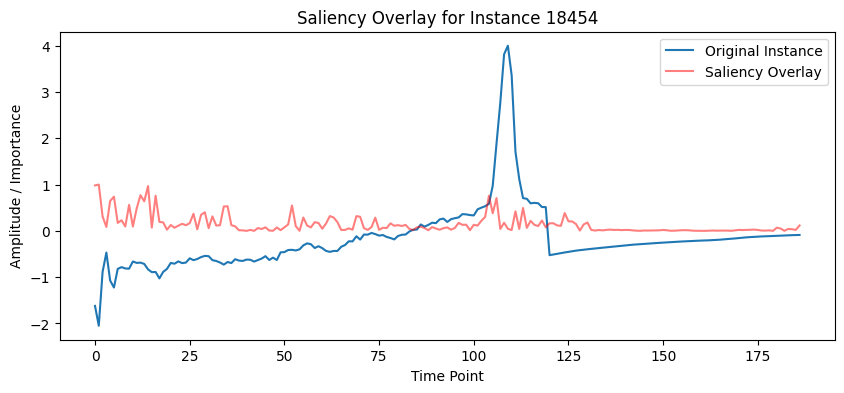

In [ ]:
overlay_saliency_maps(model, X_test_tensor, incorrect_samples, "oscnn_incorrect")

# OSCNN with Attention Experiment
### Description
Use the ECG dataset to train the OSCNN+Attention model and evaluate its performance.

### Steps
1. set up the OSCNN+Attention model
1. train the OSCNN+Attention model
1. evaluate performance with accuracy, F1 score, precision, recall

In [ ]:
# set parameters
#hidden_dim = 128
#num_layers = 2
num_classes = 5

attention_model = AttentionOSCNN(num_classes)
attention_model.to(device)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(attention_model.parameters(), lr=0.001)

print(attention_model)

AttentionOSCNN(
  (conv1): Conv1d(1, 128, kernel_size=(8,), stride=(1,), padding=same)
  (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv1d(128, 256, kernel_size=(5,), stride=(1,), padding=same)
  (bn2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv1d(256, 128, kernel_size=(3,), stride=(1,), padding=same)
  (bn3): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (intermediate): Linear(in_features=1, out_features=128, bias=True)
  (dropout): Dropout(p=0.8, inplace=False)
  (attention): SelfAttention(
    (query): Linear(in_features=128, out_features=128, bias=True)
    (key): Linear(in_features=128, out_features=128, bias=True)
    (value): Linear(in_features=128, out_features=128, bias=True)
  )
  (avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=256, out_features=5, bias=True)
)


In [ ]:
# store metrics for display
accuracies = []
precisions = []
recalls = []
f1_scores = []
losses = []
incorrect_indexes = []
attention_maps = []

# train
num_epochs = 10
for epoch in range(num_epochs):
    attention_model.train()
    total_loss = 0

    for i, (inputs, labels) in enumerate(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = attention_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        if (i+1) % 100 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], Loss: {loss.item():.4f}")

    accuracy, precision, recall, f1, epoch_incorrect_indexes, epoch_attention_maps = evaluate(attention_model, test_loader, attention=True)

    # average loss for this epoch
    epoch_loss = total_loss / len(train_loader)
    losses.append(epoch_loss)

    # store metrics
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    incorrect_indexes.append(epoch_incorrect_indexes)
    attention_maps.append(epoch_attention_maps)


Epoch [1/10], Step [100/2737], Loss: 0.3835
Epoch [1/10], Step [200/2737], Loss: 0.5626
Epoch [1/10], Step [300/2737], Loss: 0.3112
Epoch [1/10], Step [400/2737], Loss: 0.5012
Epoch [1/10], Step [500/2737], Loss: 0.4081
Epoch [1/10], Step [600/2737], Loss: 0.4382
Epoch [1/10], Step [700/2737], Loss: 0.2244
Epoch [1/10], Step [800/2737], Loss: 0.0894
Epoch [1/10], Step [900/2737], Loss: 0.3225
Epoch [1/10], Step [1000/2737], Loss: 0.3104
Epoch [1/10], Step [1100/2737], Loss: 0.2855
Epoch [1/10], Step [1200/2737], Loss: 0.5525
Epoch [1/10], Step [1300/2737], Loss: 0.4357
Epoch [1/10], Step [1400/2737], Loss: 0.1062
Epoch [1/10], Step [1500/2737], Loss: 0.1415
Epoch [1/10], Step [1600/2737], Loss: 0.2563
Epoch [1/10], Step [1700/2737], Loss: 0.1734
Epoch [1/10], Step [1800/2737], Loss: 0.2732
Epoch [1/10], Step [1900/2737], Loss: 0.4490
Epoch [1/10], Step [2000/2737], Loss: 0.3302
Epoch [1/10], Step [2100/2737], Loss: 0.1324
Epoch [1/10], Step [2200/2737], Loss: 0.2863
Epoch [1/10], Step 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-12-02 21:22:02,207 - root - INFO - Accuracy: 93.29%
2023-12-02 21:22:02,208 - root - INFO - Precision: 0.9360
2023-12-02 21:22:02,209 - root - INFO - Recall: 0.9329
2023-12-02 21:22:02,210 - root - INFO - F1 Score: 0.9322


Epoch [2/10], Step [100/2737], Loss: 0.3233
Epoch [2/10], Step [200/2737], Loss: 0.2491
Epoch [2/10], Step [300/2737], Loss: 0.1076
Epoch [2/10], Step [400/2737], Loss: 0.0776
Epoch [2/10], Step [500/2737], Loss: 0.2986
Epoch [2/10], Step [600/2737], Loss: 0.3031
Epoch [2/10], Step [700/2737], Loss: 0.1241
Epoch [2/10], Step [800/2737], Loss: 0.1887
Epoch [2/10], Step [900/2737], Loss: 0.0217
Epoch [2/10], Step [1000/2737], Loss: 0.1773
Epoch [2/10], Step [1100/2737], Loss: 0.1374
Epoch [2/10], Step [1200/2737], Loss: 0.1867
Epoch [2/10], Step [1300/2737], Loss: 0.4602
Epoch [2/10], Step [1400/2737], Loss: 0.1237
Epoch [2/10], Step [1500/2737], Loss: 0.1066
Epoch [2/10], Step [1600/2737], Loss: 0.2479
Epoch [2/10], Step [1700/2737], Loss: 0.2452
Epoch [2/10], Step [1800/2737], Loss: 0.0877
Epoch [2/10], Step [1900/2737], Loss: 0.0696
Epoch [2/10], Step [2000/2737], Loss: 0.1541
Epoch [2/10], Step [2100/2737], Loss: 0.0932
Epoch [2/10], Step [2200/2737], Loss: 0.2124
Epoch [2/10], Step 

2023-12-02 21:22:18,844 - root - INFO - Accuracy: 95.95%
2023-12-02 21:22:18,845 - root - INFO - Precision: 0.9586
2023-12-02 21:22:18,846 - root - INFO - Recall: 0.9595
2023-12-02 21:22:18,847 - root - INFO - F1 Score: 0.9556


Epoch [3/10], Step [100/2737], Loss: 0.0510
Epoch [3/10], Step [200/2737], Loss: 0.0742
Epoch [3/10], Step [300/2737], Loss: 0.2129
Epoch [3/10], Step [400/2737], Loss: 0.3936
Epoch [3/10], Step [500/2737], Loss: 0.2671
Epoch [3/10], Step [600/2737], Loss: 0.1218
Epoch [3/10], Step [700/2737], Loss: 0.0369
Epoch [3/10], Step [800/2737], Loss: 0.0846
Epoch [3/10], Step [900/2737], Loss: 0.2813
Epoch [3/10], Step [1000/2737], Loss: 0.0765
Epoch [3/10], Step [1100/2737], Loss: 0.0231
Epoch [3/10], Step [1200/2737], Loss: 0.4331
Epoch [3/10], Step [1300/2737], Loss: 0.0106
Epoch [3/10], Step [1400/2737], Loss: 0.0396
Epoch [3/10], Step [1500/2737], Loss: 0.0477
Epoch [3/10], Step [1600/2737], Loss: 0.1119
Epoch [3/10], Step [1700/2737], Loss: 0.0481
Epoch [3/10], Step [1800/2737], Loss: 0.1572
Epoch [3/10], Step [1900/2737], Loss: 0.0570
Epoch [3/10], Step [2000/2737], Loss: 0.0693
Epoch [3/10], Step [2100/2737], Loss: 0.0415
Epoch [3/10], Step [2200/2737], Loss: 0.0726
Epoch [3/10], Step 

2023-12-02 21:22:35,251 - root - INFO - Accuracy: 96.39%
2023-12-02 21:22:35,252 - root - INFO - Precision: 0.9624
2023-12-02 21:22:35,253 - root - INFO - Recall: 0.9639
2023-12-02 21:22:35,254 - root - INFO - F1 Score: 0.9607


Epoch [4/10], Step [100/2737], Loss: 0.1224
Epoch [4/10], Step [200/2737], Loss: 0.1246
Epoch [4/10], Step [300/2737], Loss: 0.0337
Epoch [4/10], Step [400/2737], Loss: 0.0214
Epoch [4/10], Step [500/2737], Loss: 0.0466
Epoch [4/10], Step [600/2737], Loss: 0.5519
Epoch [4/10], Step [700/2737], Loss: 0.0509
Epoch [4/10], Step [800/2737], Loss: 0.1216
Epoch [4/10], Step [900/2737], Loss: 0.0171
Epoch [4/10], Step [1000/2737], Loss: 0.0679
Epoch [4/10], Step [1100/2737], Loss: 0.0251
Epoch [4/10], Step [1200/2737], Loss: 0.0240
Epoch [4/10], Step [1300/2737], Loss: 0.1988
Epoch [4/10], Step [1400/2737], Loss: 0.0827
Epoch [4/10], Step [1500/2737], Loss: 0.0815
Epoch [4/10], Step [1600/2737], Loss: 0.0369
Epoch [4/10], Step [1700/2737], Loss: 0.0800
Epoch [4/10], Step [1800/2737], Loss: 0.1767
Epoch [4/10], Step [1900/2737], Loss: 0.0197
Epoch [4/10], Step [2000/2737], Loss: 0.0101
Epoch [4/10], Step [2100/2737], Loss: 0.0353
Epoch [4/10], Step [2200/2737], Loss: 0.1714
Epoch [4/10], Step 

2023-12-02 21:22:51,965 - root - INFO - Accuracy: 96.89%
2023-12-02 21:22:51,966 - root - INFO - Precision: 0.9679
2023-12-02 21:22:51,967 - root - INFO - Recall: 0.9689
2023-12-02 21:22:51,968 - root - INFO - F1 Score: 0.9662


Epoch [5/10], Step [100/2737], Loss: 0.0651
Epoch [5/10], Step [200/2737], Loss: 0.0412
Epoch [5/10], Step [300/2737], Loss: 0.0788
Epoch [5/10], Step [400/2737], Loss: 0.3599
Epoch [5/10], Step [500/2737], Loss: 0.1142
Epoch [5/10], Step [600/2737], Loss: 0.1348
Epoch [5/10], Step [700/2737], Loss: 0.2054
Epoch [5/10], Step [800/2737], Loss: 0.2315
Epoch [5/10], Step [900/2737], Loss: 0.0115
Epoch [5/10], Step [1000/2737], Loss: 0.0243
Epoch [5/10], Step [1100/2737], Loss: 0.4129
Epoch [5/10], Step [1200/2737], Loss: 0.0134
Epoch [5/10], Step [1300/2737], Loss: 0.0662
Epoch [5/10], Step [1400/2737], Loss: 0.2490
Epoch [5/10], Step [1500/2737], Loss: 0.0909
Epoch [5/10], Step [1600/2737], Loss: 0.0478
Epoch [5/10], Step [1700/2737], Loss: 0.1503
Epoch [5/10], Step [1800/2737], Loss: 0.0356
Epoch [5/10], Step [1900/2737], Loss: 0.0415
Epoch [5/10], Step [2000/2737], Loss: 0.0300
Epoch [5/10], Step [2100/2737], Loss: 0.0107
Epoch [5/10], Step [2200/2737], Loss: 0.0660
Epoch [5/10], Step 

2023-12-02 21:23:08,754 - root - INFO - Accuracy: 97.09%
2023-12-02 21:23:08,755 - root - INFO - Precision: 0.9706
2023-12-02 21:23:08,757 - root - INFO - Recall: 0.9709
2023-12-02 21:23:08,758 - root - INFO - F1 Score: 0.9681


Epoch [6/10], Step [100/2737], Loss: 0.3069
Epoch [6/10], Step [200/2737], Loss: 0.1177
Epoch [6/10], Step [300/2737], Loss: 0.0167
Epoch [6/10], Step [400/2737], Loss: 0.2537
Epoch [6/10], Step [500/2737], Loss: 0.1071
Epoch [6/10], Step [600/2737], Loss: 0.4303
Epoch [6/10], Step [700/2737], Loss: 0.1078
Epoch [6/10], Step [800/2737], Loss: 0.1146
Epoch [6/10], Step [900/2737], Loss: 0.0106
Epoch [6/10], Step [1000/2737], Loss: 0.0726
Epoch [6/10], Step [1100/2737], Loss: 0.1598
Epoch [6/10], Step [1200/2737], Loss: 0.0190
Epoch [6/10], Step [1300/2737], Loss: 0.0142
Epoch [6/10], Step [1400/2737], Loss: 0.0473
Epoch [6/10], Step [1500/2737], Loss: 0.0235
Epoch [6/10], Step [1600/2737], Loss: 0.1949
Epoch [6/10], Step [1700/2737], Loss: 0.0336
Epoch [6/10], Step [1800/2737], Loss: 0.1936
Epoch [6/10], Step [1900/2737], Loss: 0.1107
Epoch [6/10], Step [2000/2737], Loss: 0.1066
Epoch [6/10], Step [2100/2737], Loss: 0.0416
Epoch [6/10], Step [2200/2737], Loss: 0.0671
Epoch [6/10], Step 

2023-12-02 21:23:25,703 - root - INFO - Accuracy: 97.30%
2023-12-02 21:23:25,705 - root - INFO - Precision: 0.9718
2023-12-02 21:23:25,706 - root - INFO - Recall: 0.9730
2023-12-02 21:23:25,707 - root - INFO - F1 Score: 0.9716


Epoch [7/10], Step [100/2737], Loss: 0.2037
Epoch [7/10], Step [200/2737], Loss: 0.0454
Epoch [7/10], Step [300/2737], Loss: 0.2985
Epoch [7/10], Step [400/2737], Loss: 0.0305
Epoch [7/10], Step [500/2737], Loss: 0.0546
Epoch [7/10], Step [600/2737], Loss: 0.1821
Epoch [7/10], Step [700/2737], Loss: 0.2078
Epoch [7/10], Step [800/2737], Loss: 0.0845
Epoch [7/10], Step [900/2737], Loss: 0.3527
Epoch [7/10], Step [1000/2737], Loss: 0.1334
Epoch [7/10], Step [1100/2737], Loss: 0.1586
Epoch [7/10], Step [1200/2737], Loss: 0.0799
Epoch [7/10], Step [1300/2737], Loss: 0.0562
Epoch [7/10], Step [1400/2737], Loss: 0.0288
Epoch [7/10], Step [1500/2737], Loss: 0.1467
Epoch [7/10], Step [1600/2737], Loss: 0.0246
Epoch [7/10], Step [1700/2737], Loss: 0.0321
Epoch [7/10], Step [1800/2737], Loss: 0.1185
Epoch [7/10], Step [1900/2737], Loss: 0.3208
Epoch [7/10], Step [2000/2737], Loss: 0.2885
Epoch [7/10], Step [2100/2737], Loss: 0.0141
Epoch [7/10], Step [2200/2737], Loss: 0.0147
Epoch [7/10], Step 

2023-12-02 21:23:42,575 - root - INFO - Accuracy: 96.91%
2023-12-02 21:23:42,577 - root - INFO - Precision: 0.9681
2023-12-02 21:23:42,578 - root - INFO - Recall: 0.9691
2023-12-02 21:23:42,579 - root - INFO - F1 Score: 0.9680


Epoch [8/10], Step [100/2737], Loss: 0.0770
Epoch [8/10], Step [200/2737], Loss: 0.1064
Epoch [8/10], Step [300/2737], Loss: 0.1207
Epoch [8/10], Step [400/2737], Loss: 0.0173
Epoch [8/10], Step [500/2737], Loss: 0.1881
Epoch [8/10], Step [600/2737], Loss: 0.1117
Epoch [8/10], Step [700/2737], Loss: 0.0483
Epoch [8/10], Step [800/2737], Loss: 0.0739
Epoch [8/10], Step [900/2737], Loss: 0.1887
Epoch [8/10], Step [1000/2737], Loss: 0.1020
Epoch [8/10], Step [1100/2737], Loss: 0.0771
Epoch [8/10], Step [1200/2737], Loss: 0.0234
Epoch [8/10], Step [1300/2737], Loss: 0.0213
Epoch [8/10], Step [1400/2737], Loss: 0.1531
Epoch [8/10], Step [1500/2737], Loss: 0.0370
Epoch [8/10], Step [1600/2737], Loss: 0.2459
Epoch [8/10], Step [1700/2737], Loss: 0.2111
Epoch [8/10], Step [1800/2737], Loss: 0.0272
Epoch [8/10], Step [1900/2737], Loss: 0.1284
Epoch [8/10], Step [2000/2737], Loss: 0.2175
Epoch [8/10], Step [2100/2737], Loss: 0.0353
Epoch [8/10], Step [2200/2737], Loss: 0.0240
Epoch [8/10], Step 

2023-12-02 21:23:59,274 - root - INFO - Accuracy: 97.17%
2023-12-02 21:23:59,275 - root - INFO - Precision: 0.9708
2023-12-02 21:23:59,277 - root - INFO - Recall: 0.9717
2023-12-02 21:23:59,278 - root - INFO - F1 Score: 0.9711


Epoch [9/10], Step [100/2737], Loss: 0.0663
Epoch [9/10], Step [200/2737], Loss: 0.0436
Epoch [9/10], Step [300/2737], Loss: 0.1660
Epoch [9/10], Step [400/2737], Loss: 0.0300
Epoch [9/10], Step [500/2737], Loss: 0.0146
Epoch [9/10], Step [600/2737], Loss: 0.1976
Epoch [9/10], Step [700/2737], Loss: 0.0725
Epoch [9/10], Step [800/2737], Loss: 0.1747
Epoch [9/10], Step [900/2737], Loss: 0.0146
Epoch [9/10], Step [1000/2737], Loss: 0.2798
Epoch [9/10], Step [1100/2737], Loss: 0.0124
Epoch [9/10], Step [1200/2737], Loss: 0.0493
Epoch [9/10], Step [1300/2737], Loss: 0.2189
Epoch [9/10], Step [1400/2737], Loss: 0.1817
Epoch [9/10], Step [1500/2737], Loss: 0.2491
Epoch [9/10], Step [1600/2737], Loss: 0.0619
Epoch [9/10], Step [1700/2737], Loss: 0.0092
Epoch [9/10], Step [1800/2737], Loss: 0.0130
Epoch [9/10], Step [1900/2737], Loss: 0.3538
Epoch [9/10], Step [2000/2737], Loss: 0.2286
Epoch [9/10], Step [2100/2737], Loss: 0.0136
Epoch [9/10], Step [2200/2737], Loss: 0.0100
Epoch [9/10], Step 

2023-12-02 21:24:16,351 - root - INFO - Accuracy: 96.30%
2023-12-02 21:24:16,352 - root - INFO - Precision: 0.9635
2023-12-02 21:24:16,353 - root - INFO - Recall: 0.9630
2023-12-02 21:24:16,354 - root - INFO - F1 Score: 0.9576


Epoch [10/10], Step [100/2737], Loss: 0.0700
Epoch [10/10], Step [200/2737], Loss: 0.0823
Epoch [10/10], Step [300/2737], Loss: 0.0191
Epoch [10/10], Step [400/2737], Loss: 0.0316
Epoch [10/10], Step [500/2737], Loss: 0.1535
Epoch [10/10], Step [600/2737], Loss: 0.0146
Epoch [10/10], Step [700/2737], Loss: 0.0222
Epoch [10/10], Step [800/2737], Loss: 0.0389
Epoch [10/10], Step [900/2737], Loss: 0.0623
Epoch [10/10], Step [1000/2737], Loss: 0.0208
Epoch [10/10], Step [1100/2737], Loss: 0.1487
Epoch [10/10], Step [1200/2737], Loss: 0.0095
Epoch [10/10], Step [1300/2737], Loss: 0.0050
Epoch [10/10], Step [1400/2737], Loss: 0.1655
Epoch [10/10], Step [1500/2737], Loss: 0.0205
Epoch [10/10], Step [1600/2737], Loss: 0.1038
Epoch [10/10], Step [1700/2737], Loss: 0.2872
Epoch [10/10], Step [1800/2737], Loss: 0.1049
Epoch [10/10], Step [1900/2737], Loss: 0.1157
Epoch [10/10], Step [2000/2737], Loss: 0.0033
Epoch [10/10], Step [2100/2737], Loss: 0.1748
Epoch [10/10], Step [2200/2737], Loss: 0.01

2023-12-02 21:24:34,055 - root - INFO - Accuracy: 97.52%
2023-12-02 21:24:34,056 - root - INFO - Precision: 0.9750
2023-12-02 21:24:34,057 - root - INFO - Recall: 0.9752
2023-12-02 21:24:34,058 - root - INFO - F1 Score: 0.9739


In [ ]:
torch.save(attention_model, "tsc_oscnn_attention.pth")

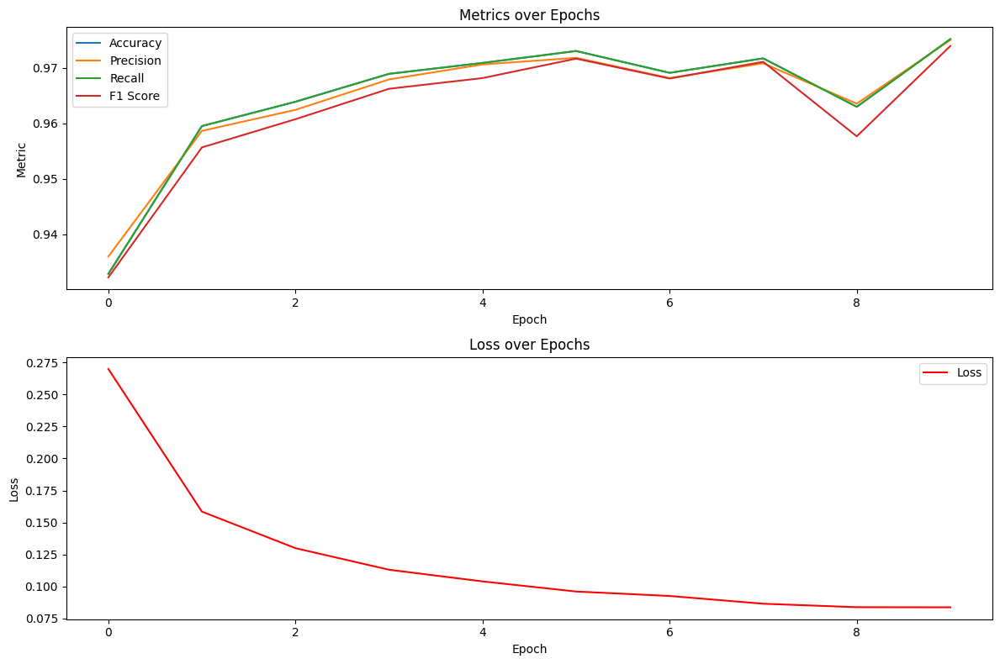

In [ ]:
plot_metrics(accuracies, precisions, recalls, f1_scores, losses, "oscnn_attention_metrics")

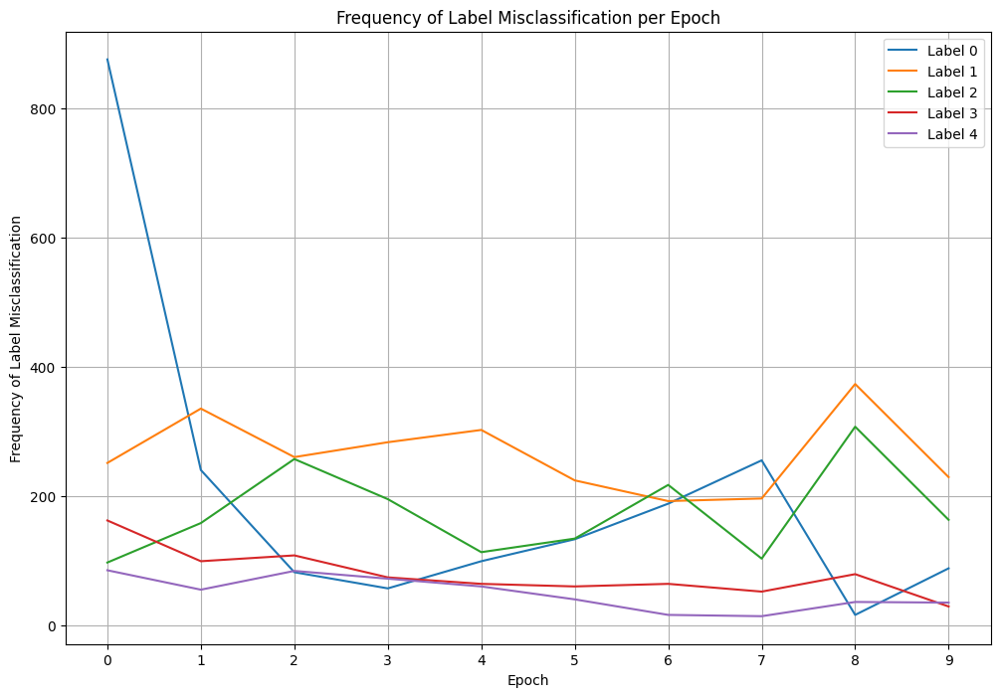

In [ ]:
plot_incorrect_predictions(incorrect_indexes, test_loader, "oscnn_attention_misclassification")

In [ ]:
idx = correct_samples[0]
sample_input = X_test_tensor[idx:idx+1]
visualize_model_graph(attention_model, sample_input, file_name=f"computation_graph_oscnn_attention_{idx}")

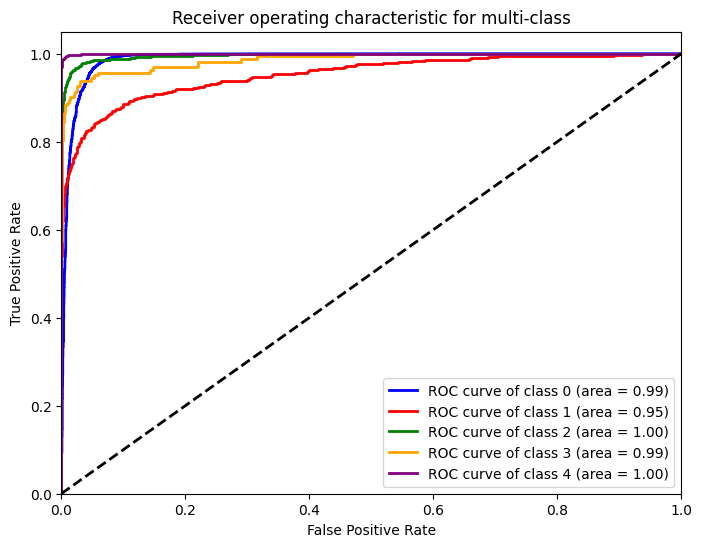

In [ ]:
roc_plot(attention_model, X_test, y_test, num_classes, "roc_oscnn_attention")

# OSCNN with Attention LIME Analysis

In [ ]:
explanations_html = []
for test_idx in correct_samples:
    test_instance = X_test[test_idx]
    true_label = y_test[test_idx]
    explanation_html = explain_instance(
        attention_model,
        explainer,
        test_instance,
        true_label,
        test_idx,
        y_train
    )
    explanations_html.append(explanation_html)

with open("lime_oscnn_attention_correct.html", "w") as file:
    for explanation_html in explanations_html:
        file.write(explanation_html + "<hr>")

2023-12-02 21:25:04,820 - root - INFO - Instance 10331: Predicted Label: 0, True Label: 0.0
2023-12-02 21:25:05,422 - root - INFO - Instance 9675: Predicted Label: 0, True Label: 0.0
2023-12-02 21:25:06,076 - root - INFO - Instance 1989: Predicted Label: 0, True Label: 0.0
2023-12-02 21:25:06,737 - root - INFO - Instance 6684: Predicted Label: 0, True Label: 0.0
2023-12-02 21:25:07,378 - root - INFO - Instance 15661: Predicted Label: 0, True Label: 0.0
2023-12-02 21:25:08,049 - root - INFO - Instance 9910: Predicted Label: 0, True Label: 0.0
2023-12-02 21:25:08,716 - root - INFO - Instance 2778: Predicted Label: 0, True Label: 0.0
2023-12-02 21:25:09,375 - root - INFO - Instance 7433: Predicted Label: 0, True Label: 0.0
2023-12-02 21:25:10,022 - root - INFO - Instance 4684: Predicted Label: 0, True Label: 0.0
2023-12-02 21:25:10,670 - root - INFO - Instance 4121: Predicted Label: 0, True Label: 0.0
2023-12-02 21:25:11,312 - root - INFO - Instance 11552: Predicted Label: 0, True Label: 

In [ ]:
explanations_html = []
for test_idx in incorrect_samples:
    test_instance = X_test[test_idx]
    true_label = y_test[test_idx]
    explanation_html = explain_instance(
        attention_model,
        explainer,
        test_instance,
        true_label,
        test_idx,
        y_train
    )
    explanations_html.append(explanation_html)

with open("lime_oscnn_attention_incorrect.html", "w") as file:
    for explanation_html in explanations_html:
        file.write(explanation_html + "<hr>")

2023-12-02 21:25:21,451 - root - INFO - Instance 18119: Predicted Label: 0, True Label: 1.0
2023-12-02 21:25:21,979 - root - INFO - Instance 20245: Predicted Label: 3, True Label: 3.0
2023-12-02 21:25:22,550 - root - INFO - Instance 18352: Predicted Label: 0, True Label: 1.0
2023-12-02 21:25:23,218 - root - INFO - Instance 4441: Predicted Label: 2, True Label: 0.0
2023-12-02 21:25:23,888 - root - INFO - Instance 13116: Predicted Label: 0, True Label: 0.0
2023-12-02 21:25:24,463 - root - INFO - Instance 18196: Predicted Label: 0, True Label: 1.0
2023-12-02 21:25:25,081 - root - INFO - Instance 20244: Predicted Label: 3, True Label: 3.0
2023-12-02 21:25:25,648 - root - INFO - Instance 18622: Predicted Label: 0, True Label: 1.0
2023-12-02 21:25:26,247 - root - INFO - Instance 20207: Predicted Label: 2, True Label: 3.0
2023-12-02 21:25:26,882 - root - INFO - Instance 2329: Predicted Label: 2, True Label: 0.0
2023-12-02 21:25:27,479 - root - INFO - Instance 20012: Predicted Label: 2, True L

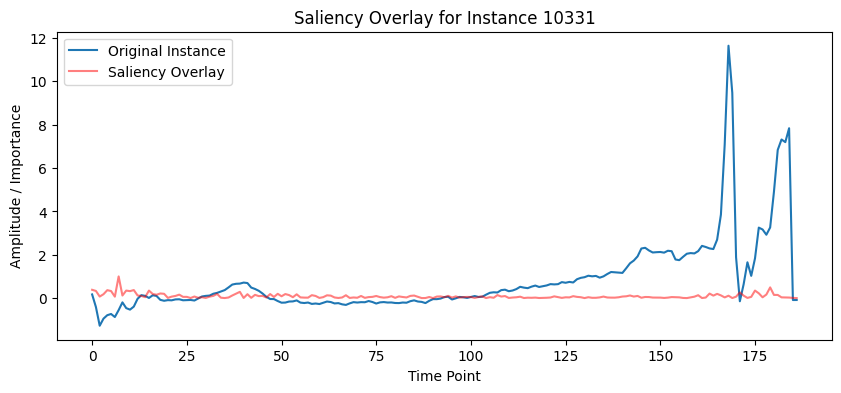

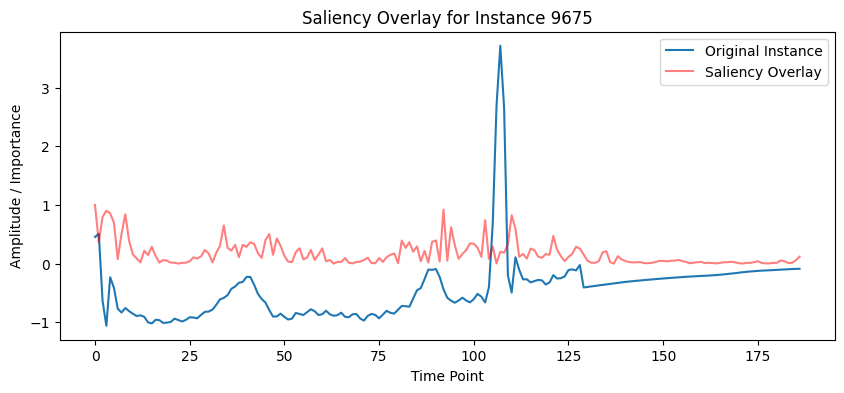

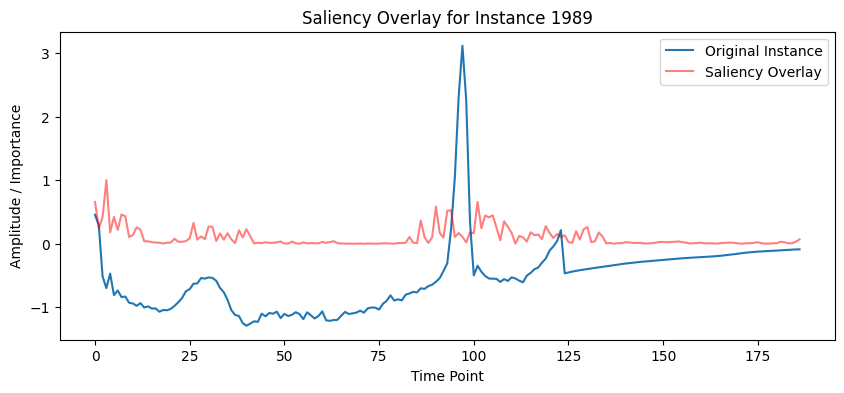

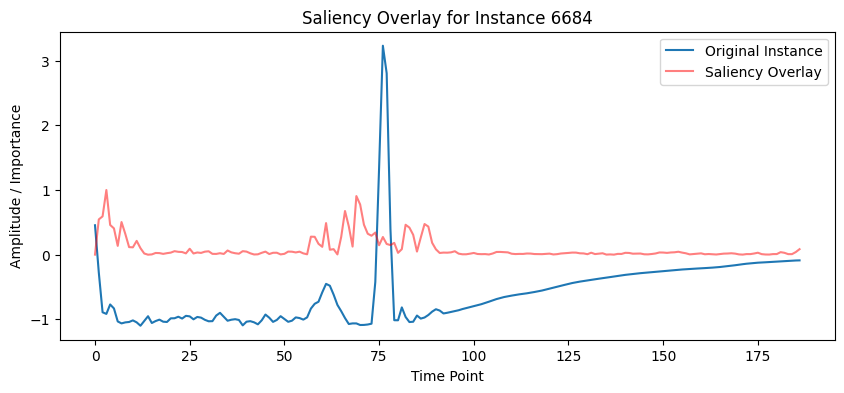

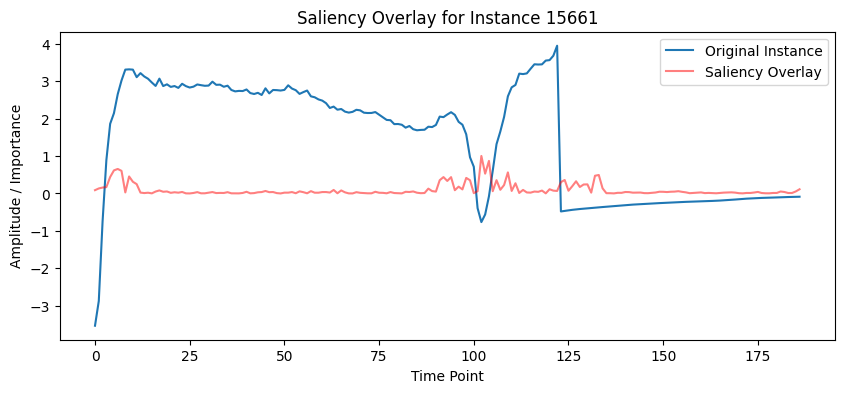

...

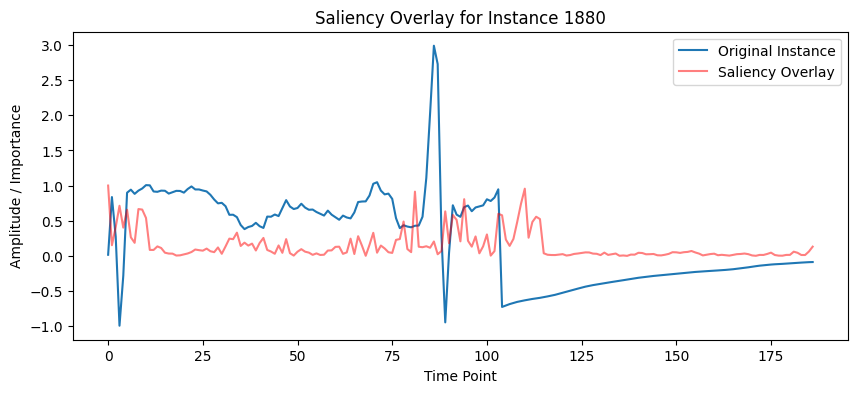

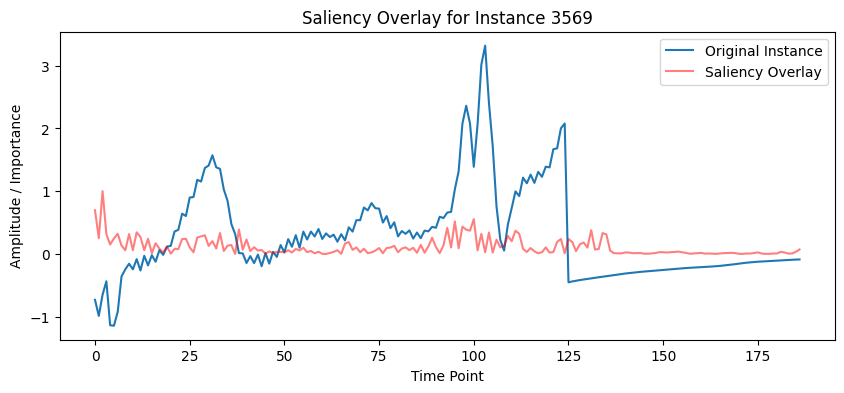

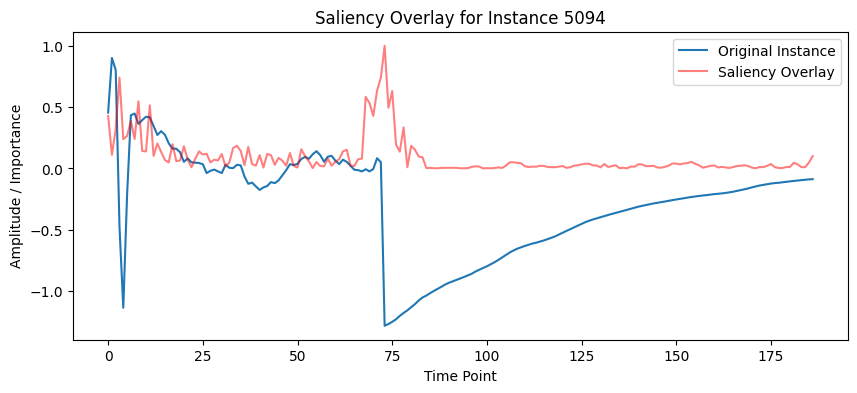

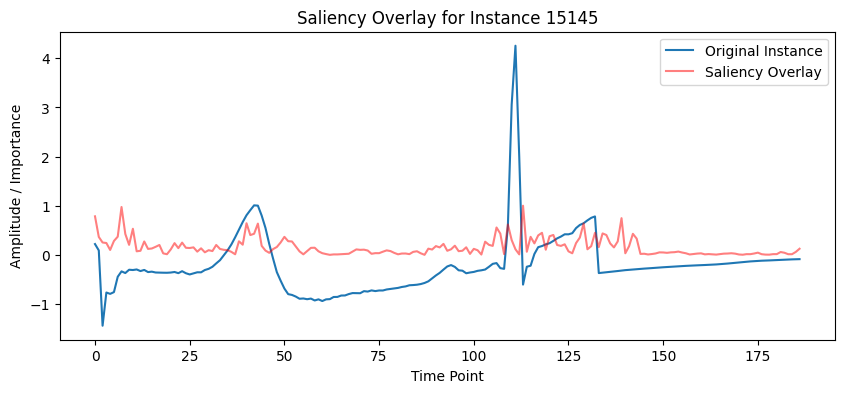

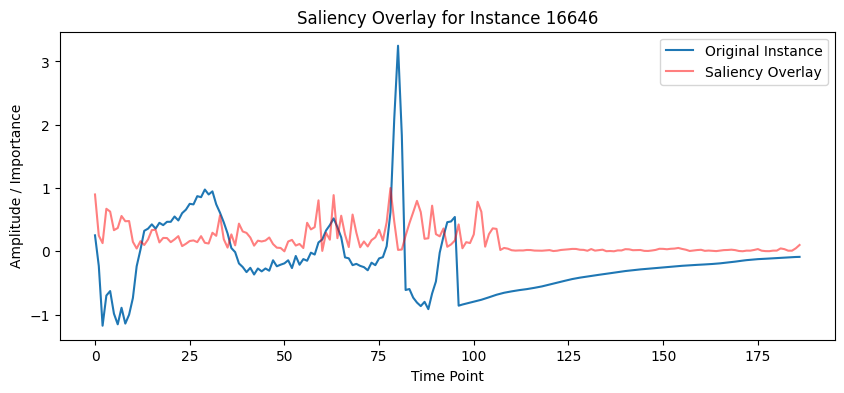

In [ ]:
overlay_saliency_maps(attention_model, X_test_tensor, correct_samples, "oscnn_attention_correct")

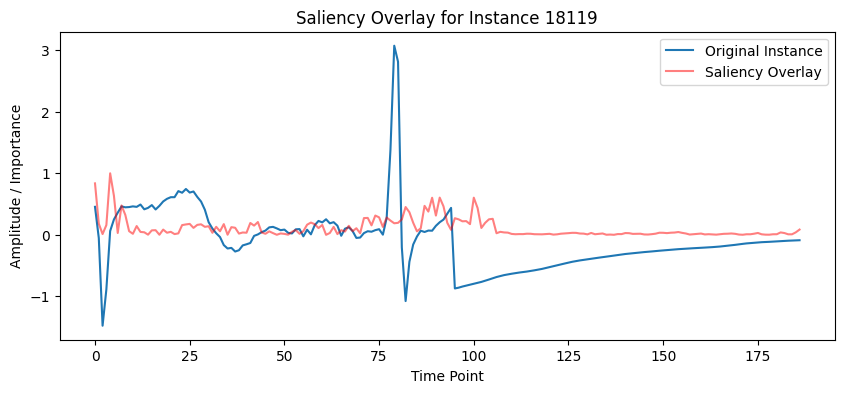

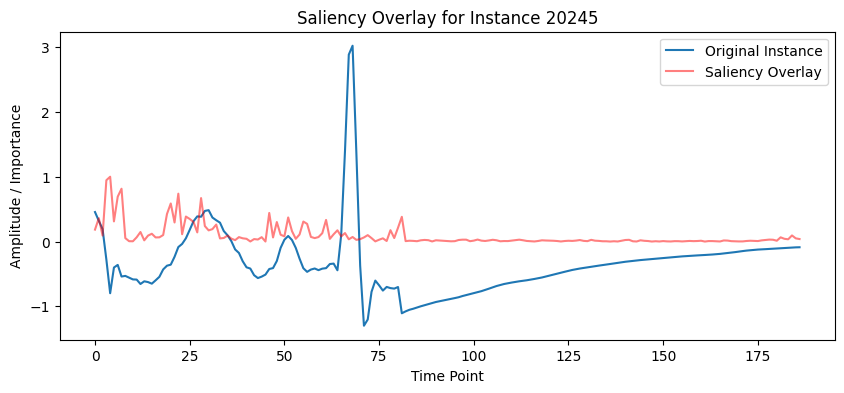

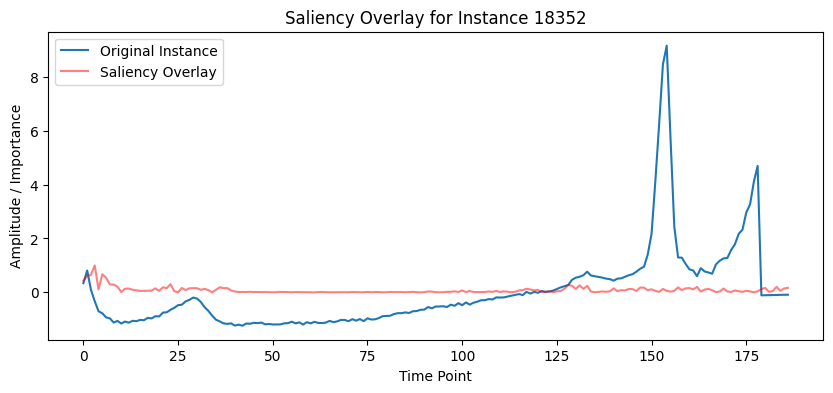

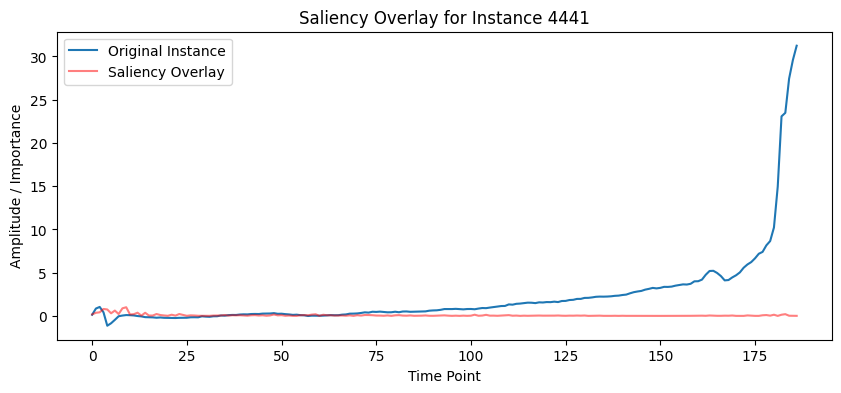

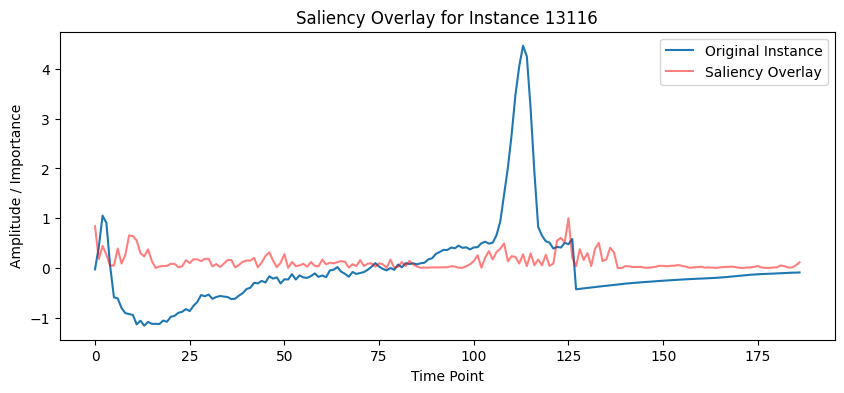

...

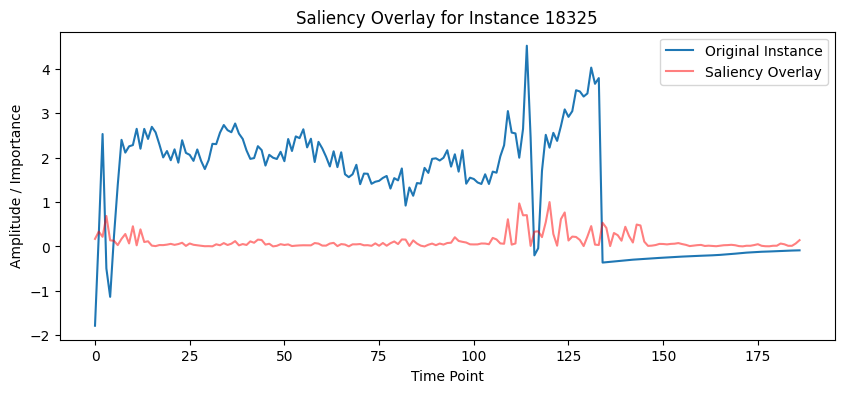

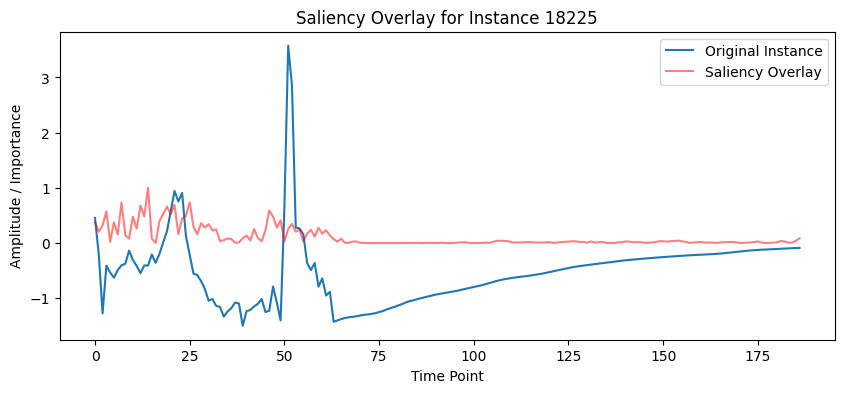

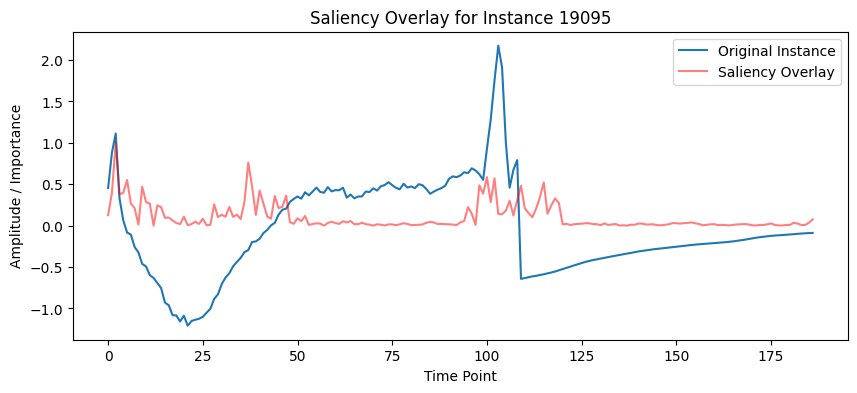

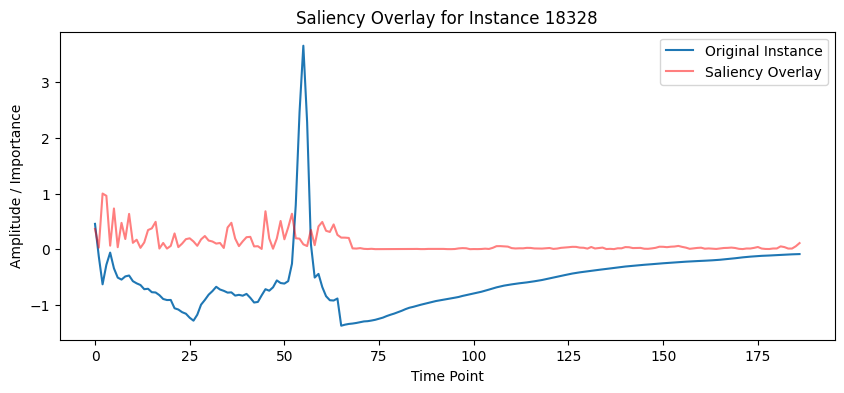

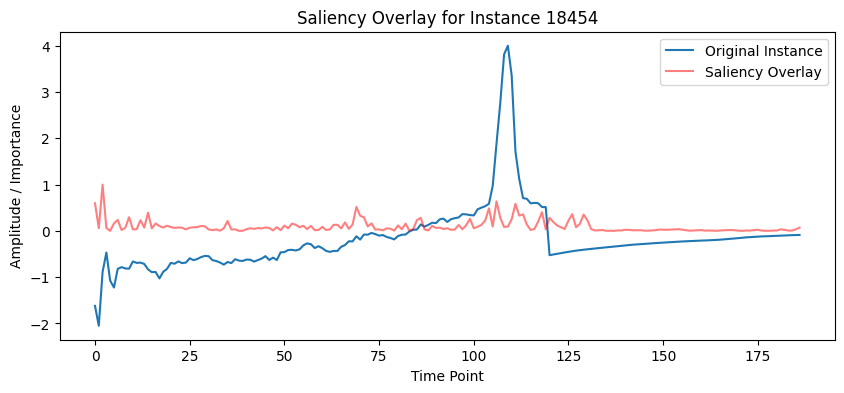

In [ ]:
overlay_saliency_maps(attention_model, X_test_tensor, incorrect_samples, "oscnn_attention_incorrect")

# Attention Weights Heatmap

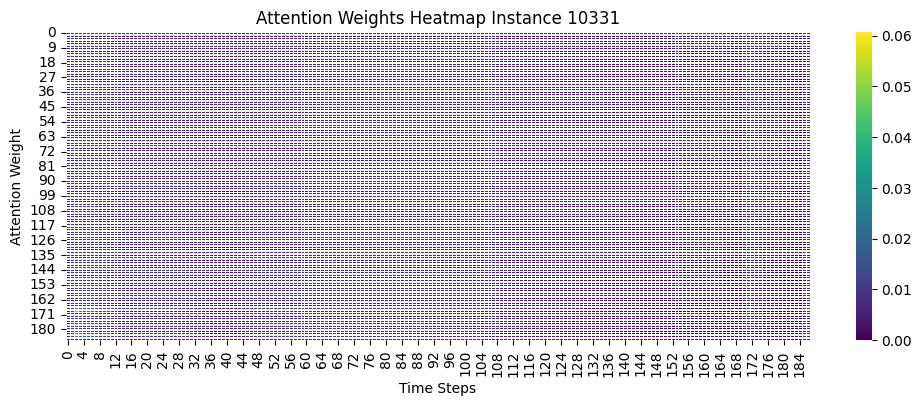

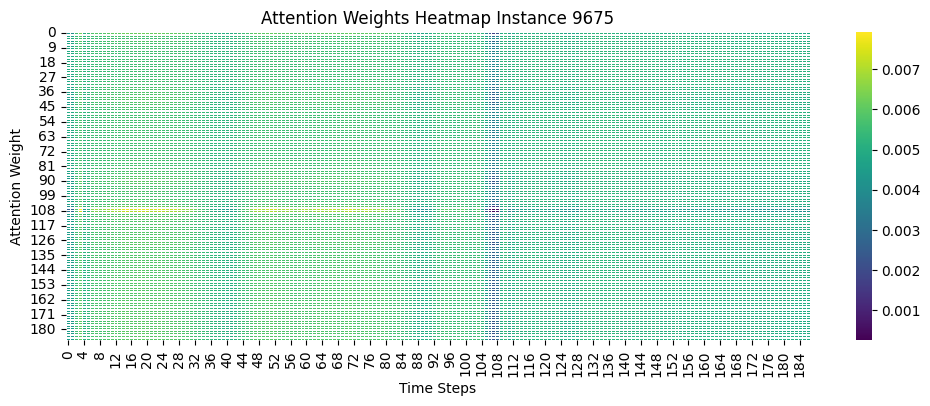

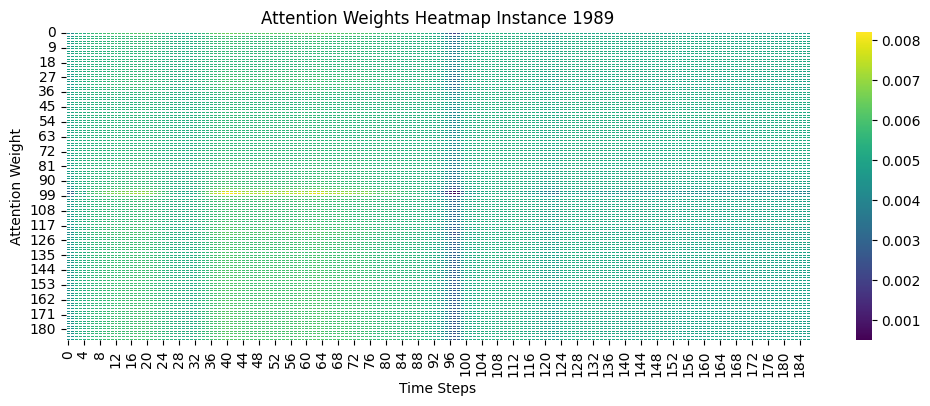

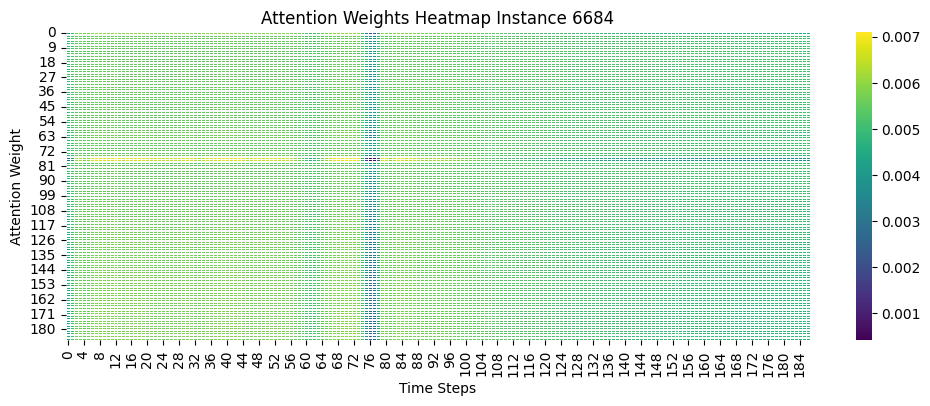

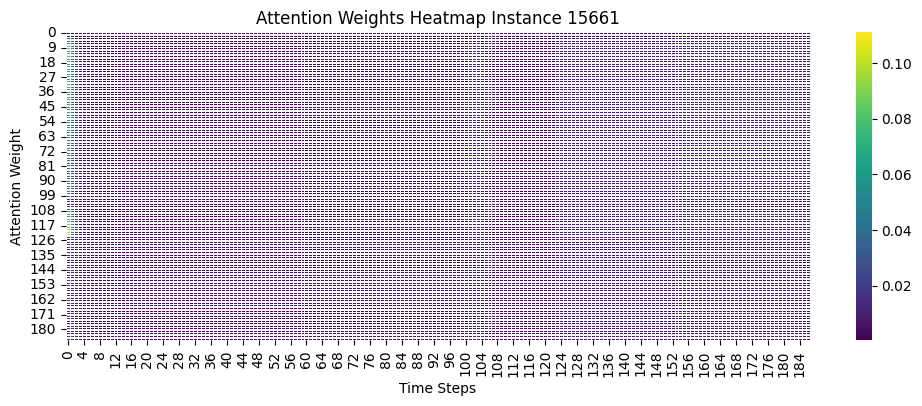

...

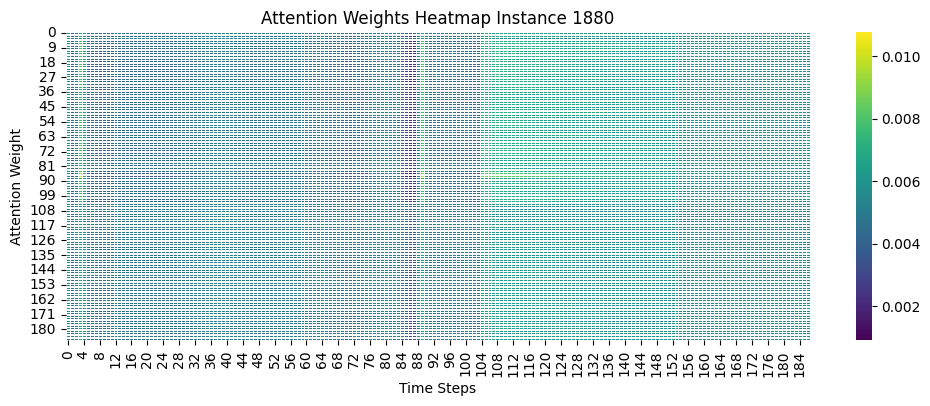

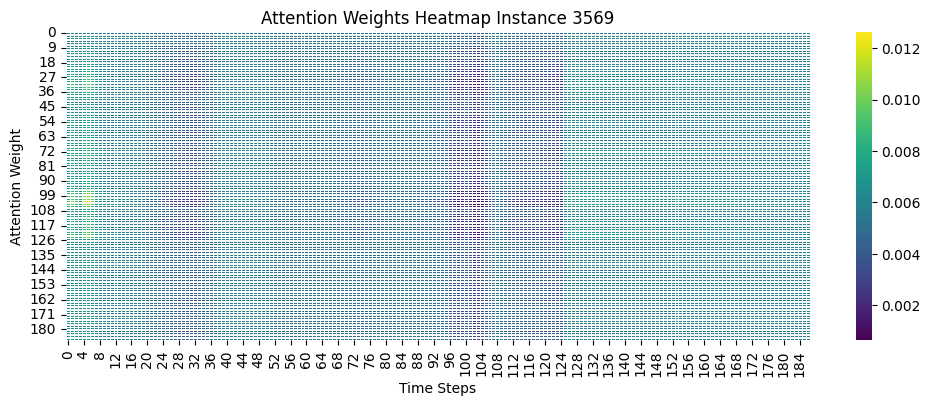

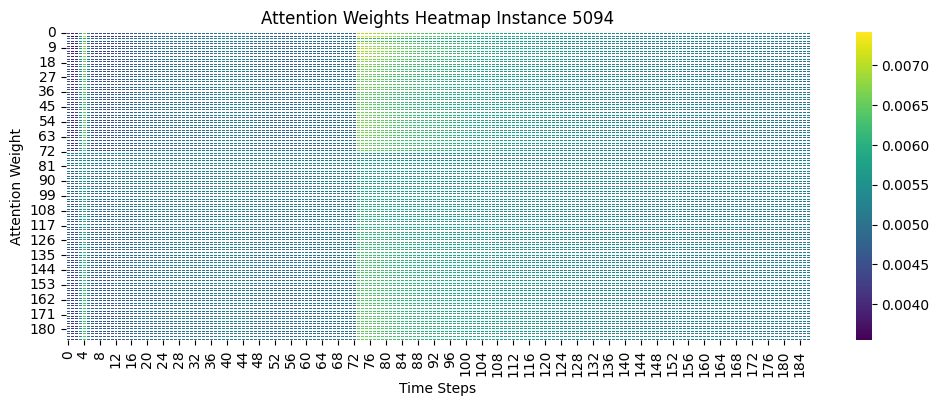

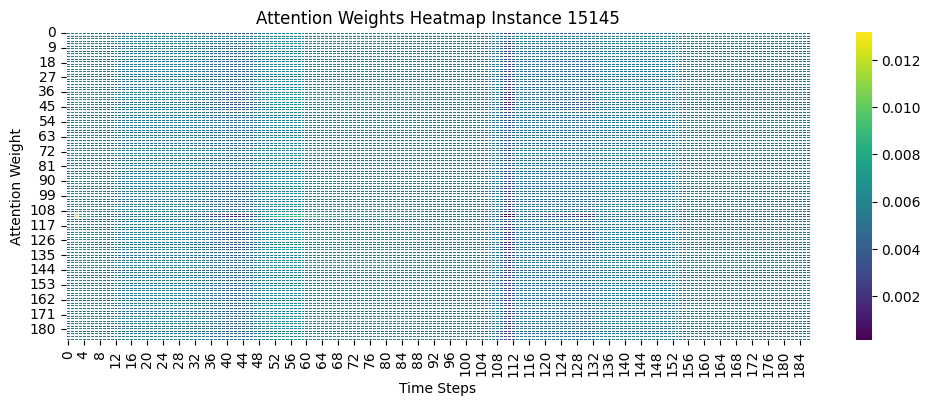

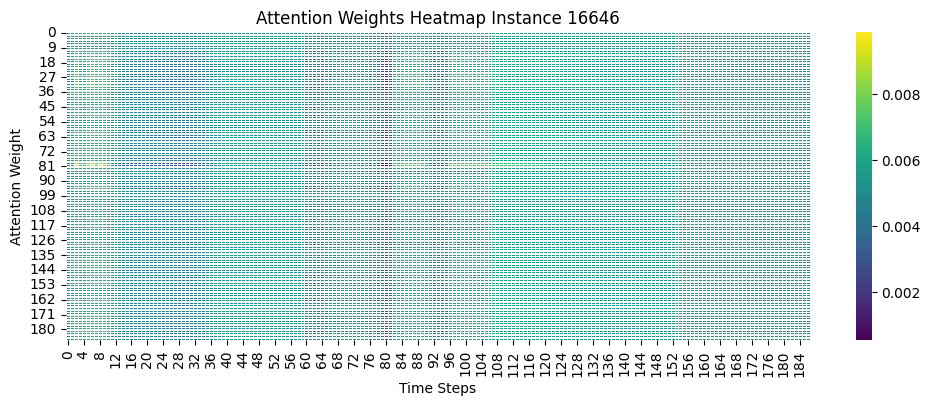

In [ ]:
for sample_idx in correct_samples:
    sample_input = X_test_tensor[sample_idx].cpu().numpy()
    batch_weights = attention_maps[-1][sample_idx//batch_size]
    sample_attention = batch_weights[sample_idx%batch_size]

    # plot heatmap
    plt.figure(figsize=(12, 4))
    sns.heatmap(sample_attention, cmap="viridis", linewidths=0.5)
    plt.title(f"Attention Weights Heatmap Instance {sample_idx}")
    plt.xlabel("Time Steps")
    plt.ylabel("Attention Weight")

    plt.savefig(f"attention_weights_{sample_idx}")
    plt.show()

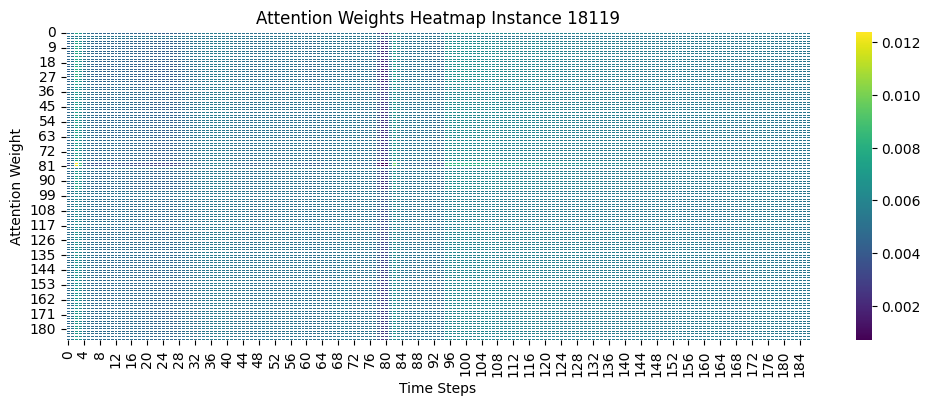

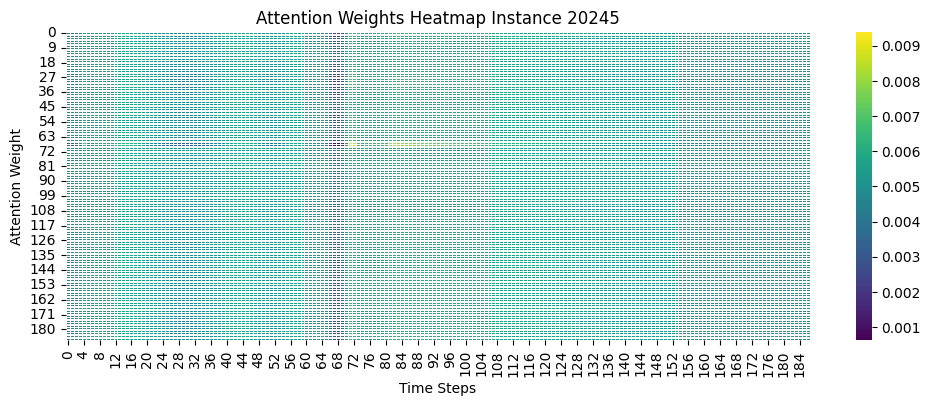

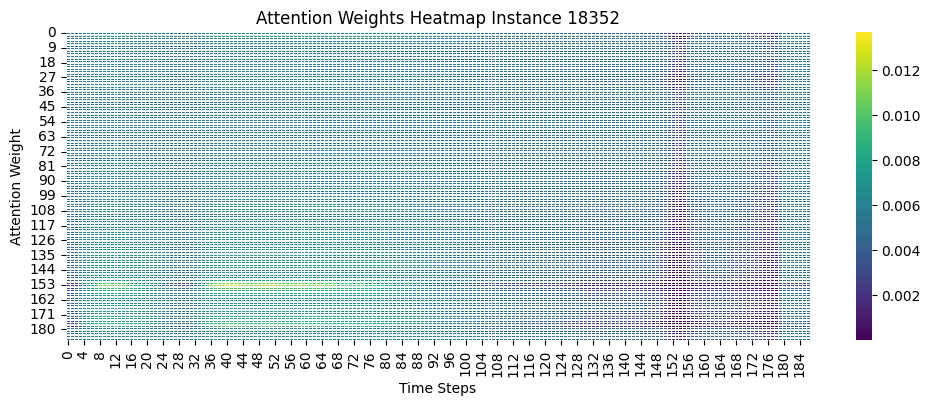

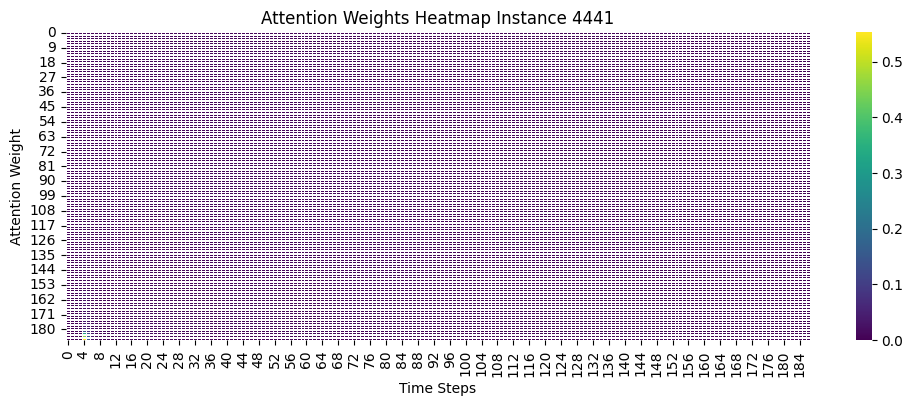

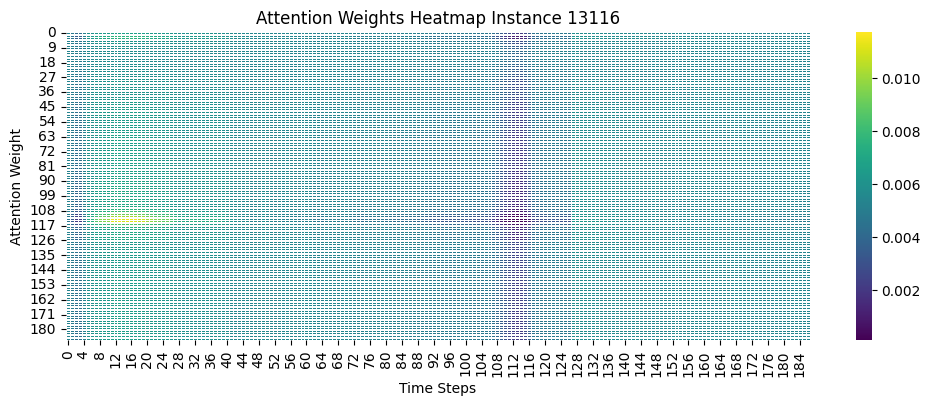

...

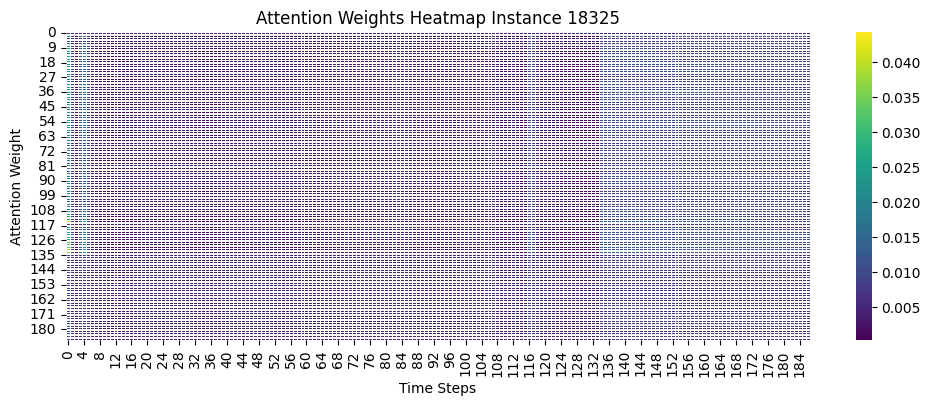

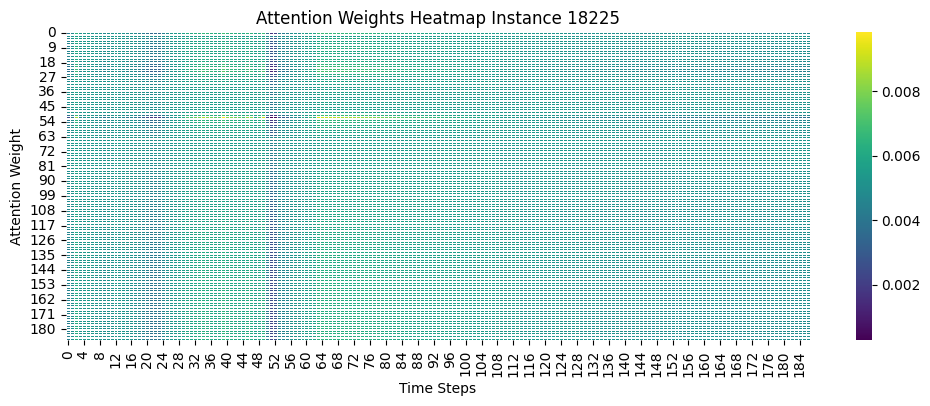

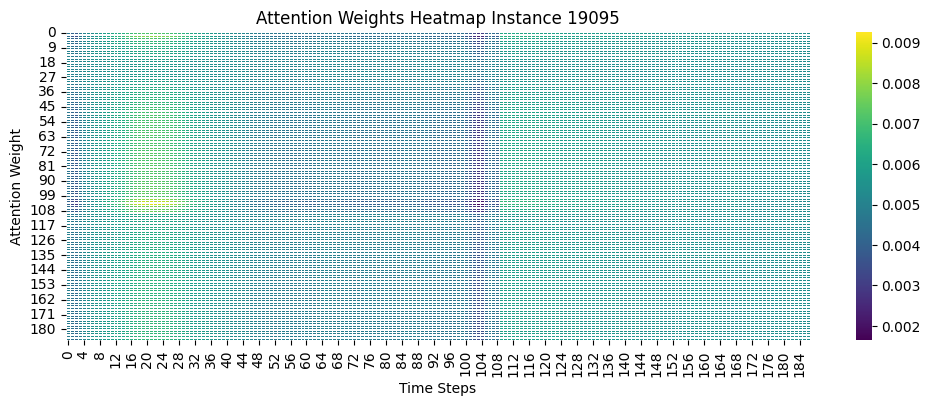

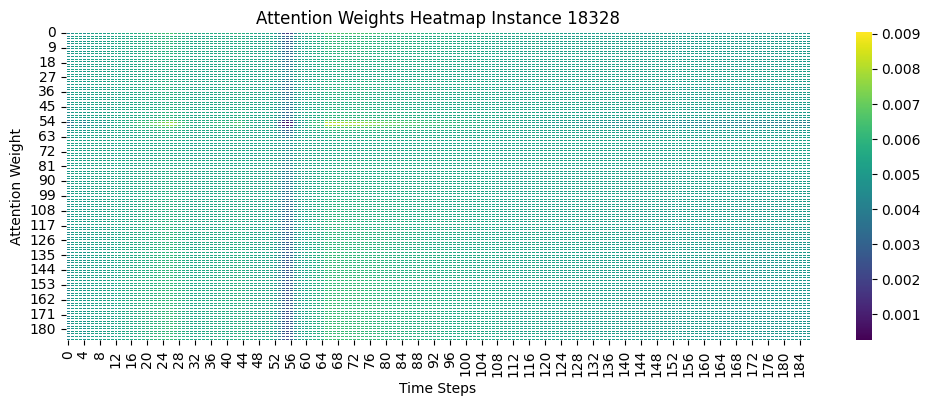

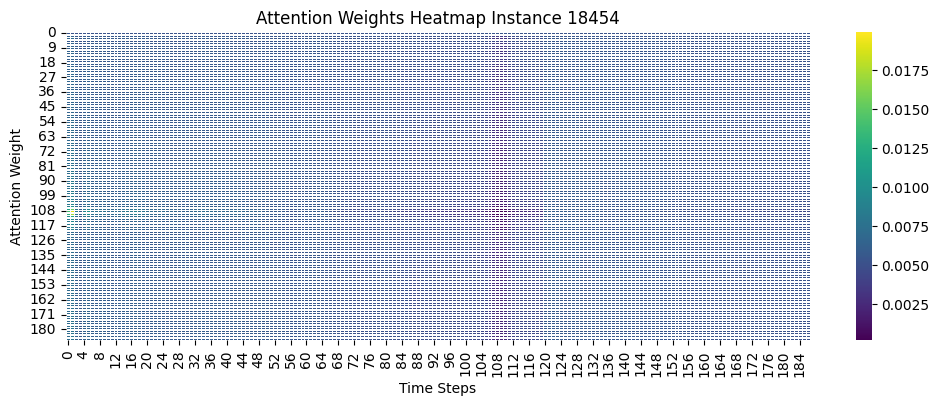

In [ ]:
for sample_idx in incorrect_samples:
    sample_input = X_test_tensor[sample_idx].cpu().numpy()
    batch_weights = attention_maps[-1][sample_idx//batch_size]
    sample_attention = batch_weights[sample_idx%batch_size]

    # plot heatmap
    plt.figure(figsize=(12, 4))
    sns.heatmap(sample_attention, cmap="viridis", linewidths=0.5)
    plt.title(f"Attention Weights Heatmap Instance {sample_idx}")
    plt.xlabel("Time Steps")
    plt.ylabel("Attention Weight")

    plt.savefig(f"attention_weights_{sample_idx}")
    plt.show()

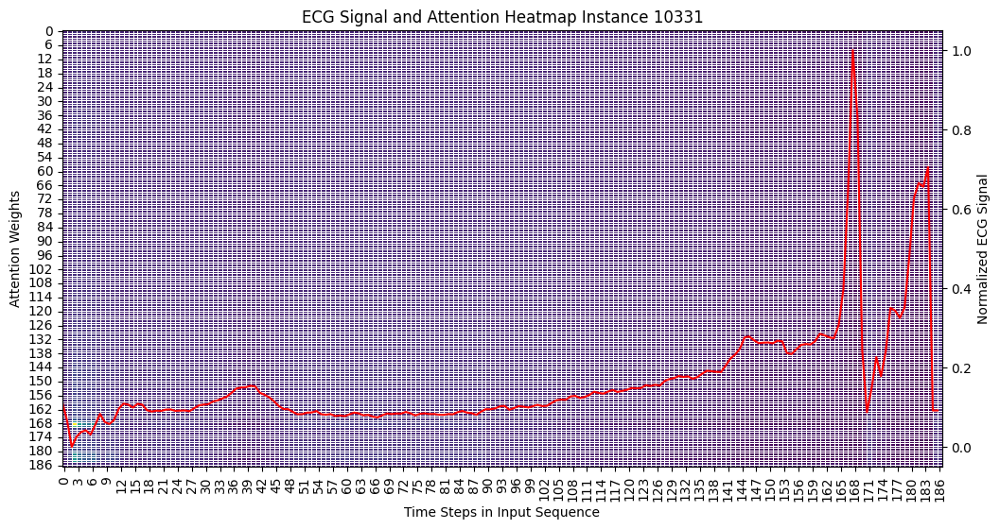

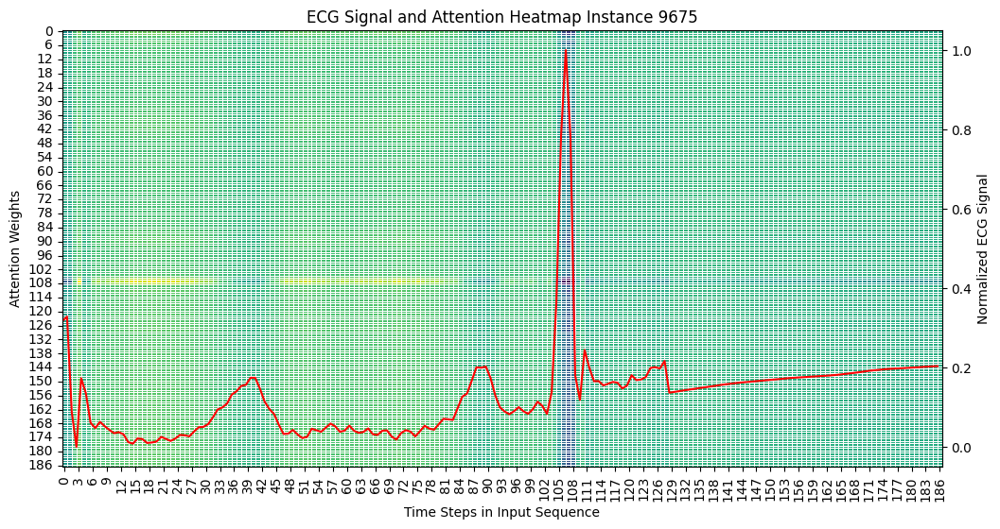

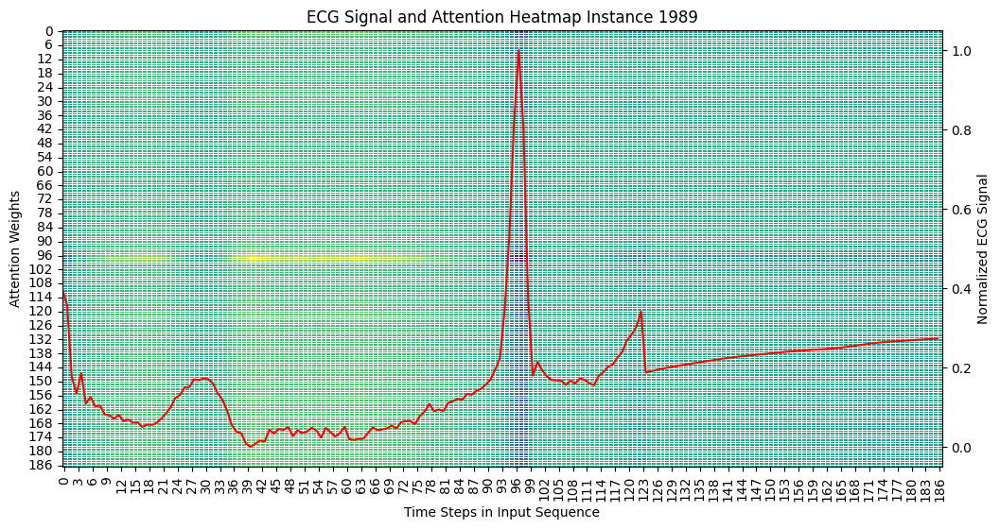

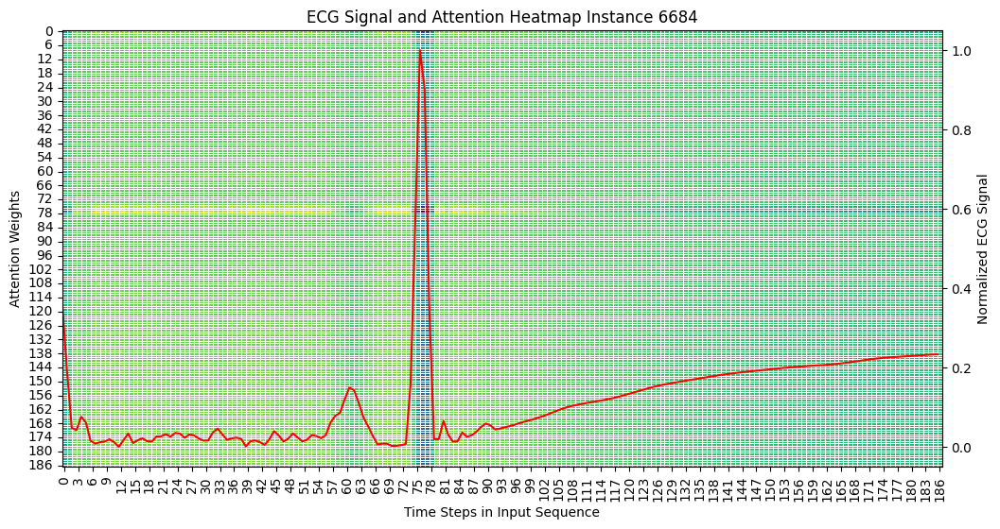

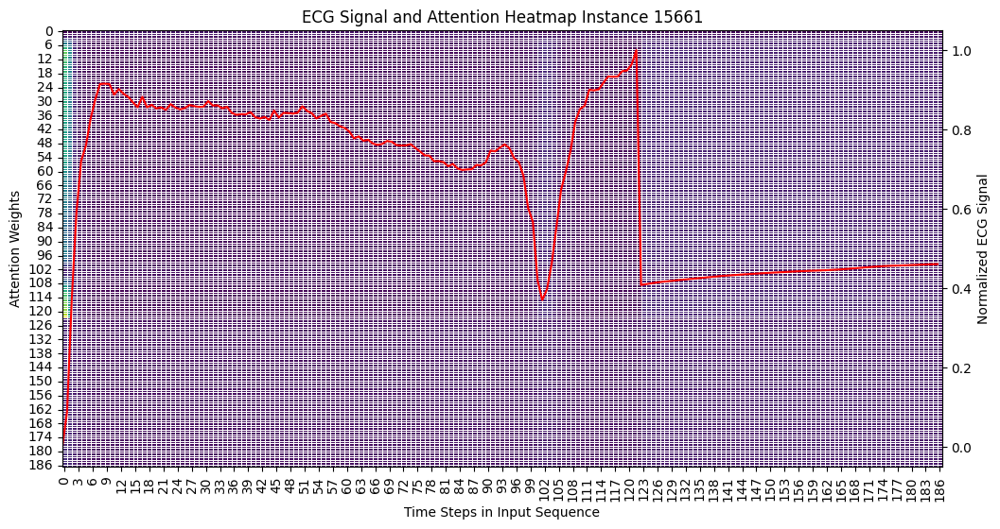

...

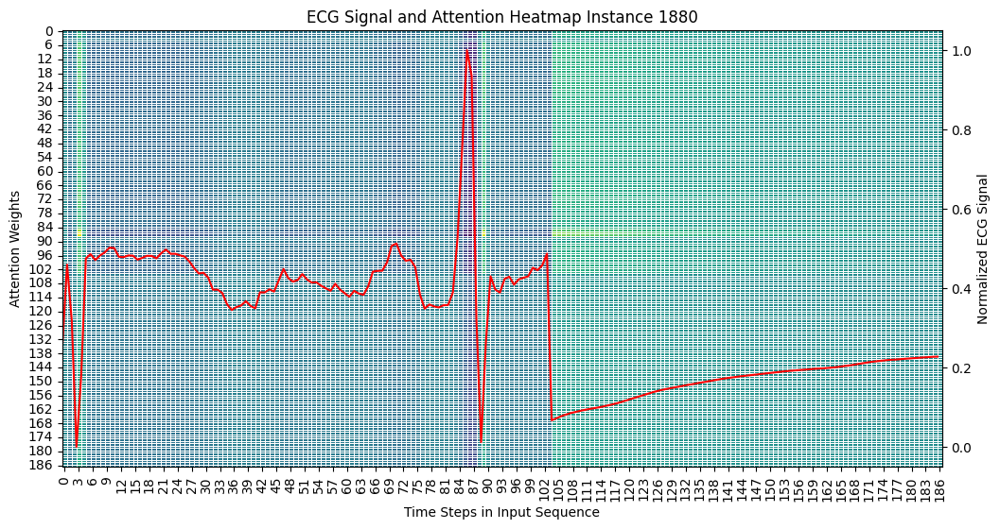

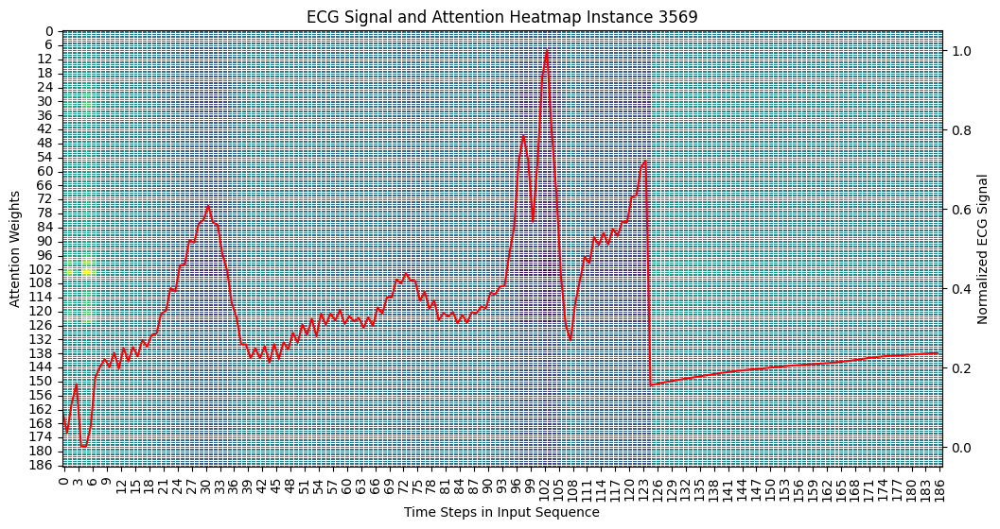

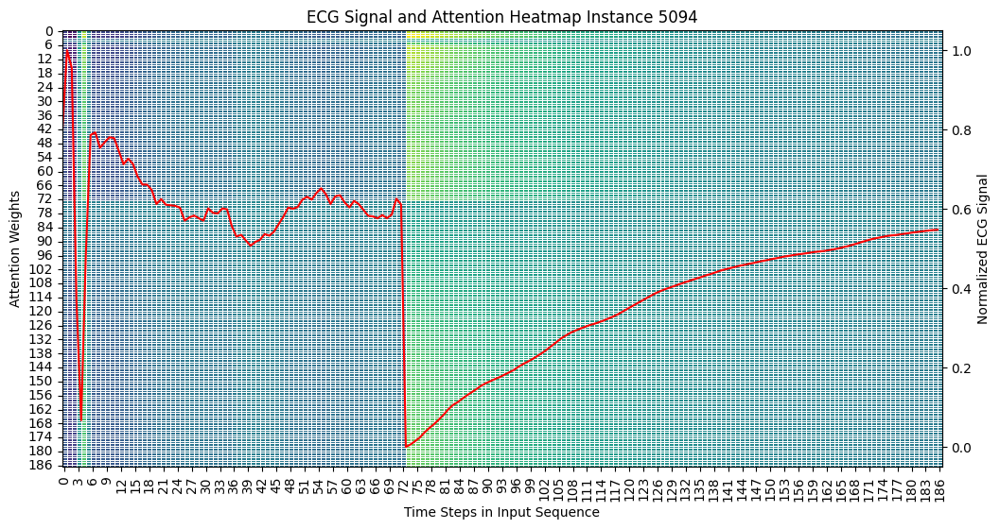

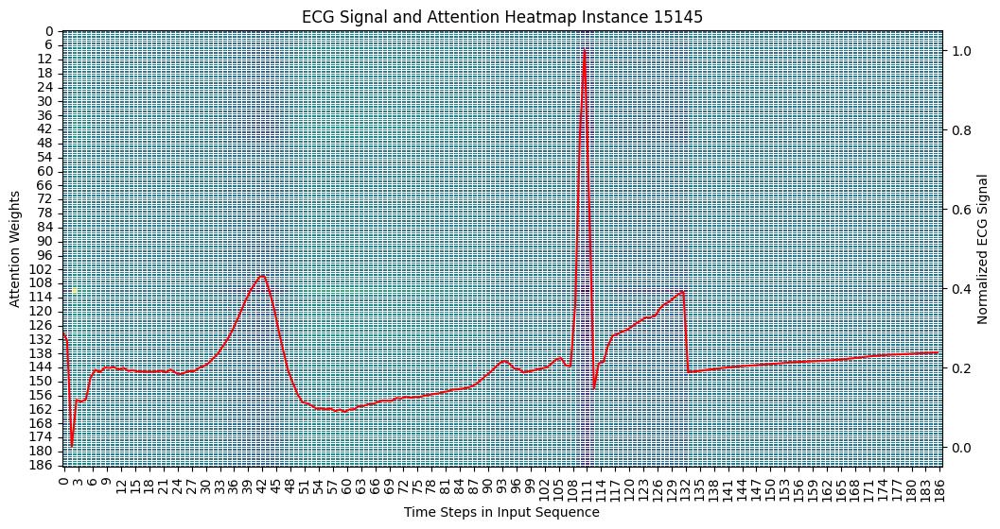

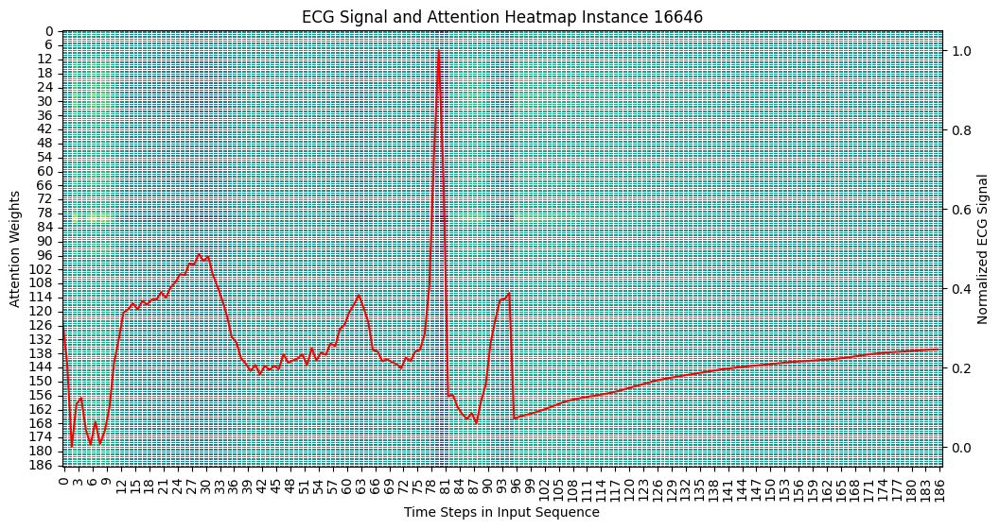

In [ ]:
for sample_idx in correct_samples:
    sample_input = X_test_tensor[sample_idx].cpu().numpy()
    batch_weights = attention_maps[-1][sample_idx//batch_size]
    sample_attention = batch_weights[sample_idx%batch_size]

    # normalize ECG signal for visualization
    normalized_ecg_sample = (sample_input - sample_input.min()) / (sample_input.max() - sample_input.min())

    # create figure and axis
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # plot heatmap
    sns.heatmap(sample_attention, cmap="viridis", linewidths=0.5, ax=ax1, cbar=False)
    ax1.set_xlabel("Time Steps in Input Sequence")
    ax1.set_ylabel("Attention Weights")
    ax1.set_title(f"ECG Signal and Attention Heatmap Instance {sample_idx}")

    # create a second y-axis for the ECG signal
    ax2 = ax1.twinx()
    ax2.plot(normalized_ecg_sample, color="r")
    ax2.set_ylabel("Normalized ECG Signal")

    plt.savefig(f"attention_weights_overlay_{sample_idx}")
    plt.show()

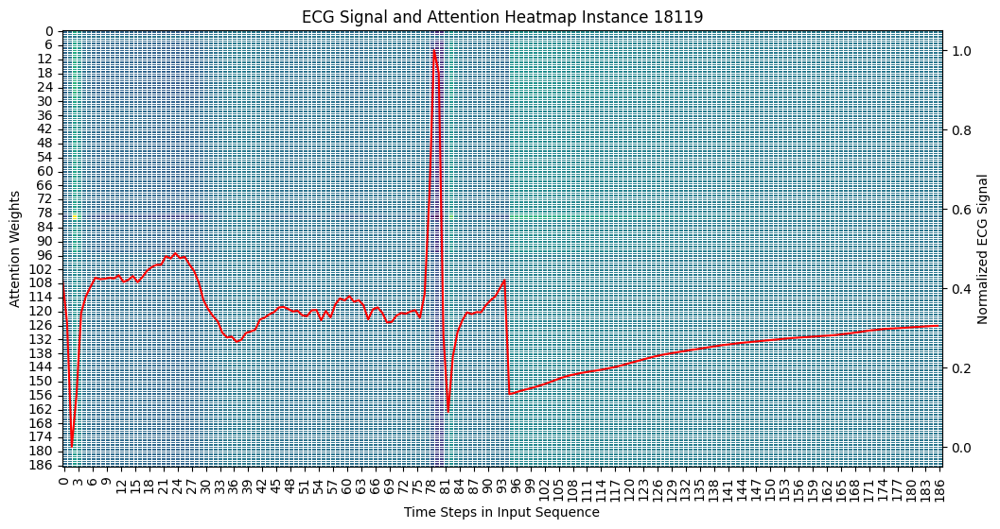

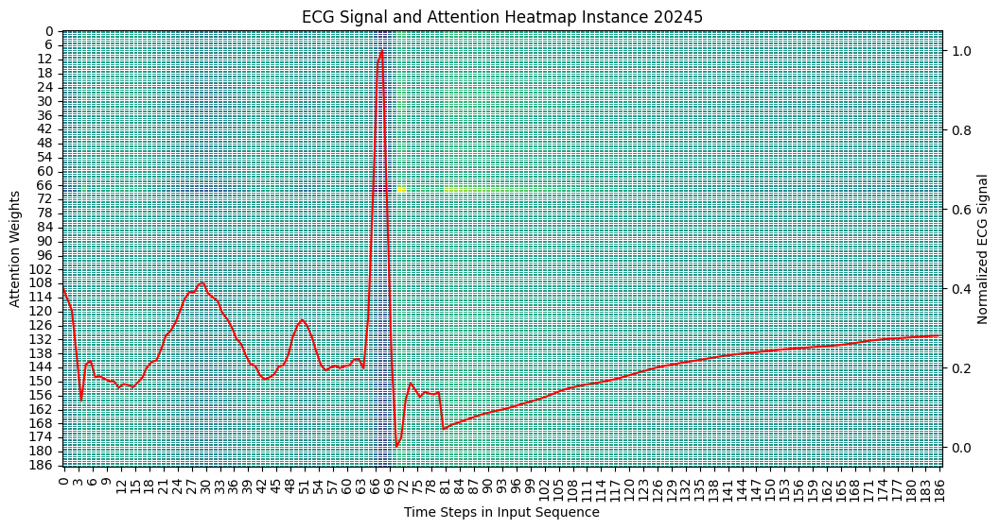

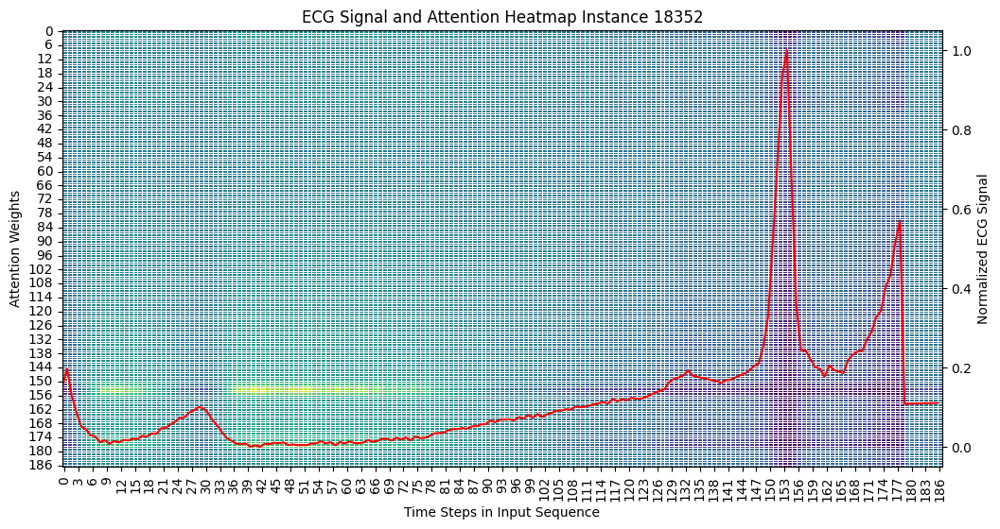

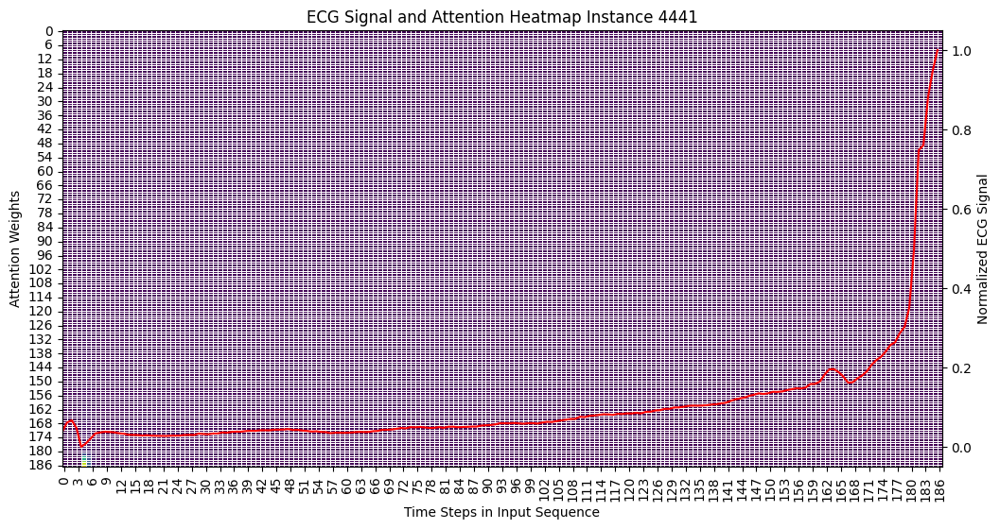

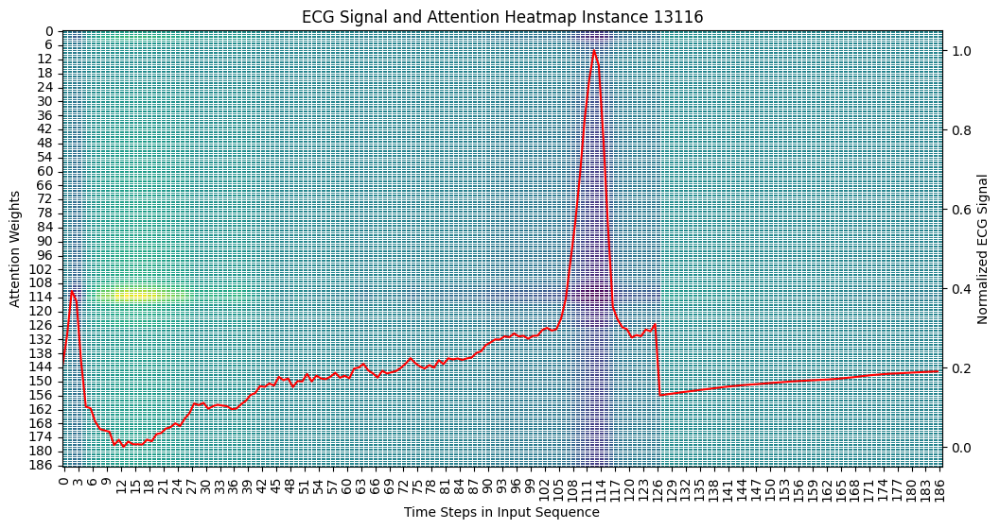

...

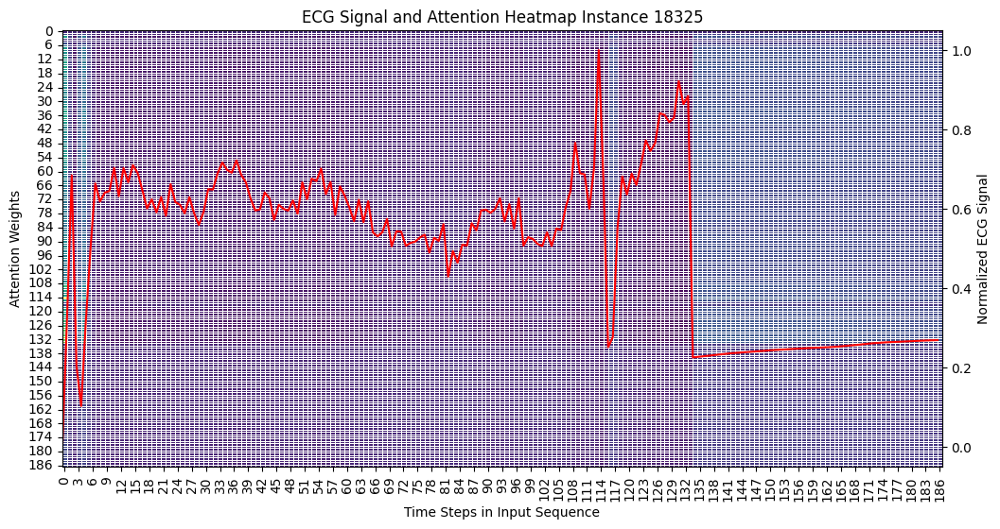

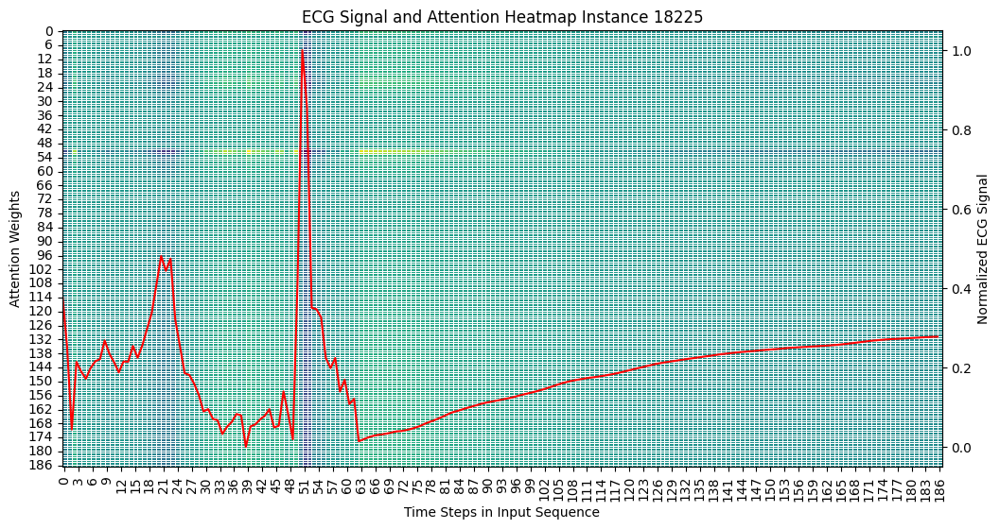

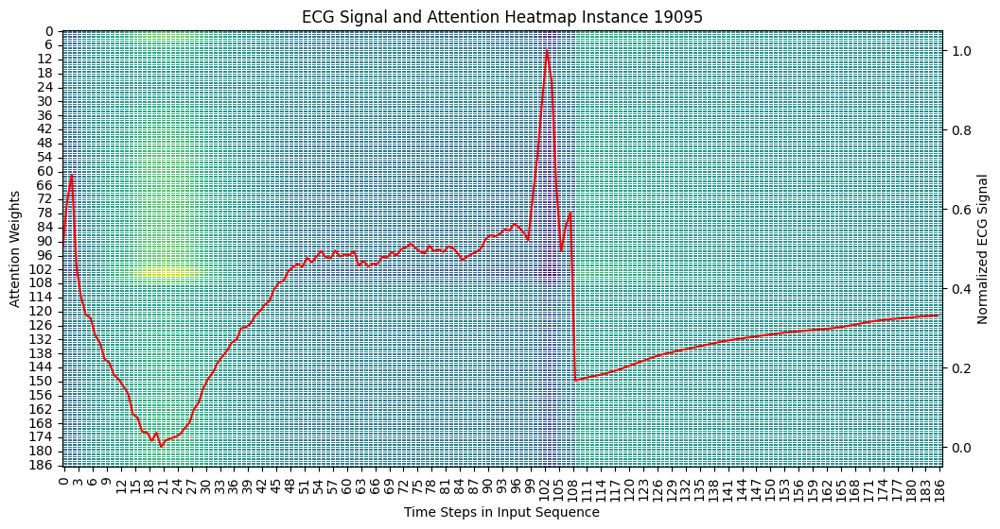

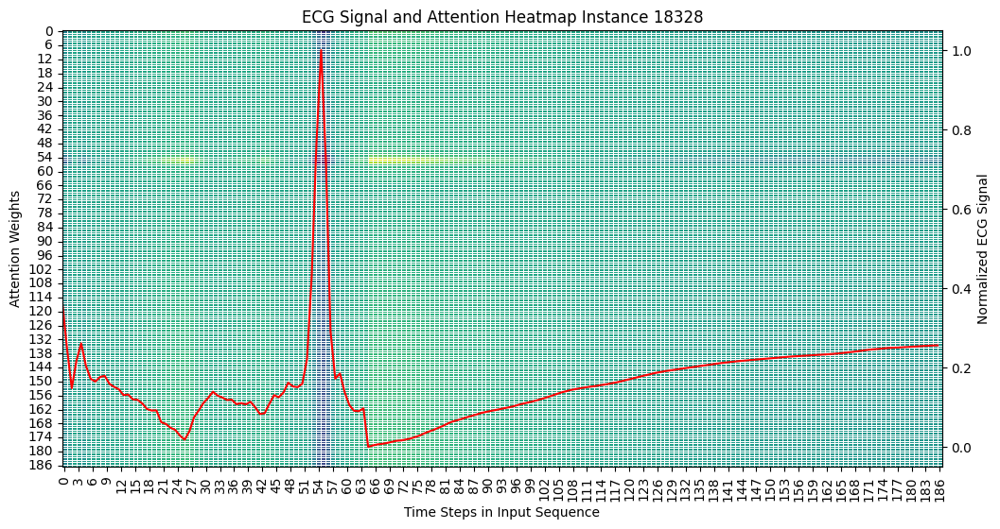

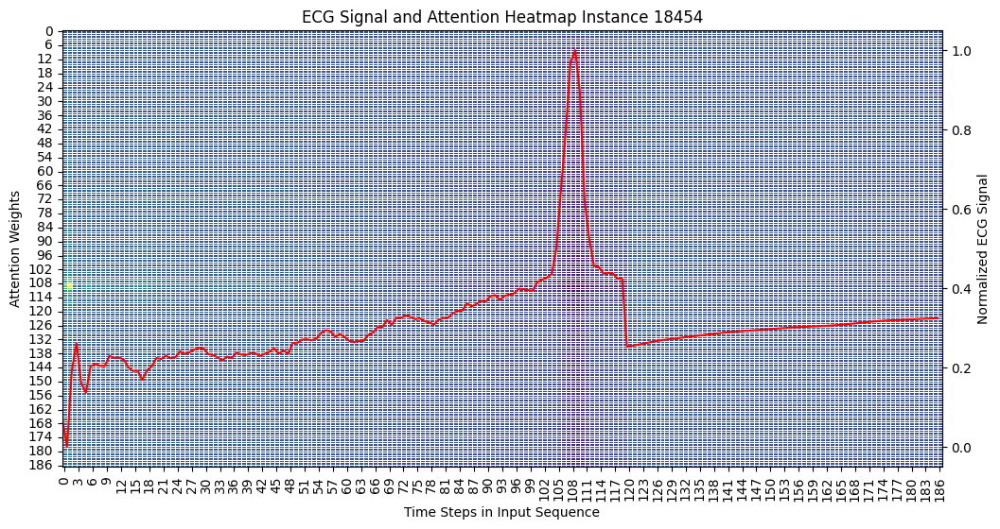

In [ ]:
for sample_idx in incorrect_samples:
    sample_input = X_test_tensor[sample_idx].cpu().numpy()
    batch_weights = attention_maps[-1][sample_idx//batch_size]
    sample_attention = batch_weights[sample_idx%batch_size]

    # normalize ECG signal for visualization
    normalized_ecg_sample = (sample_input - sample_input.min()) / (sample_input.max() - sample_input.min())

    # create figure and axis
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # plot heatmap
    sns.heatmap(sample_attention, cmap="viridis", linewidths=0.5, ax=ax1, cbar=False)
    ax1.set_xlabel("Time Steps in Input Sequence")
    ax1.set_ylabel("Attention Weights")
    ax1.set_title(f"ECG Signal and Attention Heatmap Instance {sample_idx}")

    # create a second y-axis for the ECG signal
    ax2 = ax1.twinx()
    ax2.plot(normalized_ecg_sample, color="r")
    ax2.set_ylabel("Normalized ECG Signal")

    plt.savefig(f"attention_weights_overlay_{sample_idx}")
    plt.show()

In [ ]:
import os
import zipfile
from google.colab import files

exclude_dirs = {
    "/content/.config",
    "/content/tsc_attention",
    "/content/.config",
    "/content/.ipynb_checkpoints",
    "/content/sample_data",
}
exclude_files = {
    "heartbeat.zip",
    "kaggle.json",
    "mitbih_test.csv",
    "mitbih_train.csv",
    "ptbdb_abnormal.csv",
    "ptbdb_normal.csv",
    "tsc_oscnn.zip",
}

zip_filename = "/content/tsc_oscnn.zip"
with zipfile.ZipFile(zip_filename, "w") as zipf:
    for root, dirs, files_ in os.walk("/content"):
        dirs[:] = [d for d in dirs if os.path.join(root, d) not in exclude_dirs]

        for file in files_:
            if file not in exclude_files:
                print(file)
                file_path = os.path.join(root, file)
                zipf.write(file_path)

files.download(zip_filename)

attention_weights_3675.png
attention_weights_20245.png
attention_weights_16646.png
saliency_overlay_oscnn_correct_9675.png
saliency_overlay_oscnn_incorrect_20012.png
attention_weights_overlay_10331.png
saliency_overlay_oscnn_incorrect_19730.png
saliency_overlay_oscnn_correct_12288.png
attention_weights_13996.png
saliency_overlay_oscnn_correct_6684.png
attention_weights_overlay_4684.png
saliency_overlay_oscnn_incorrect_18622.png
attention_weights_overlay_15661.png
saliency_overlay_oscnn_attention_correct_10331.png
saliency_overlay_oscnn_incorrect_18617.png
attention_weights_overlay_5094.png
saliency_overlay_oscnn_correct_4121.png
saliency_overlay_oscnn_attention_incorrect_18375.png
saliency_overlay_oscnn_attention_incorrect_18196.png
saliency_overlay_oscnn_attention_correct_3569.png
saliency_overlay_oscnn_attention_correct_12929.png
attention_weights_18352.png
saliency_overlay_oscnn_correct_2960.png
attention_weights_13116.png
saliency_overlay_oscnn_attention_incorrect_18352.png
attenti

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>